In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from enum import Enum
from typing import Any, List
from skimage.segmentation import mark_boundaries, slic
import scipy.stats as stats

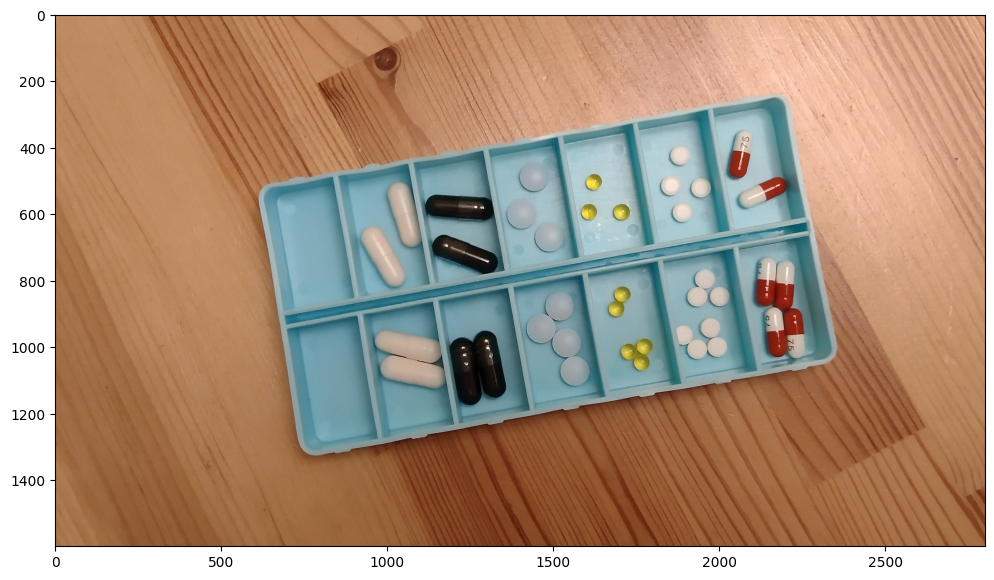

In [3]:
calib = cv2.imread('calib.png')[..., ::-1]
plt.subplots(1, 1, figsize=(12,8))[1].imshow(calib);

In [82]:
class PillType(Enum):
    PROBIO = 1    # duże białe kapsułki
    CARBON = 2    # duże czarne kapsułki
    KETO = 3      # niebieskie tabletki
    ESPU = 4      # małe żółte kapsułki
    BIOX = 5      # małe białe tabletki
    LINE = 6      # czerwono-białe kapsułki (klasa trudna - realizacja opcjonalna)

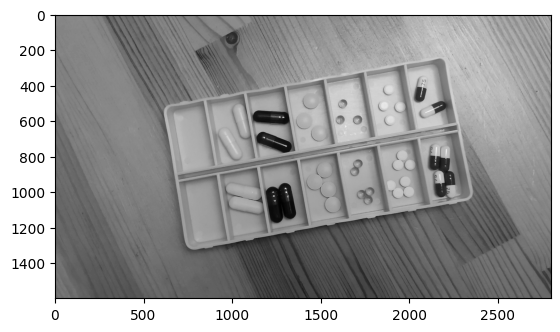

In [83]:
calib_grey = cv2.cvtColor(calib, cv2.COLOR_BGR2GRAY)
plt.imshow(calib_grey, cmap='gray')

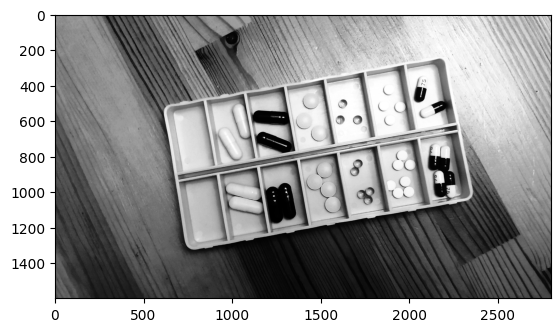

In [84]:
eq_hist = cv2.equalizeHist(calib_grey)
plt.imshow(eq_hist, cmap='gray')

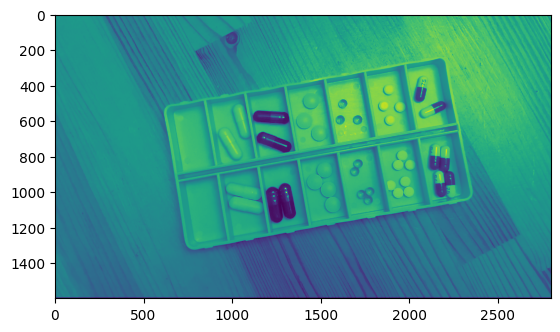

In [85]:
contours = cv2.findContours(eq_hist, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
plt.imshow(cv2.drawContours(calib_grey, contours[0], -1, (0,255,0), 3))

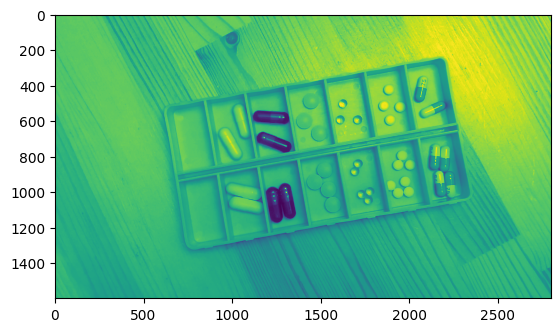

In [5]:
hsv_calib = cv2.cvtColor(calib, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv_calib)
plt.imshow(v)

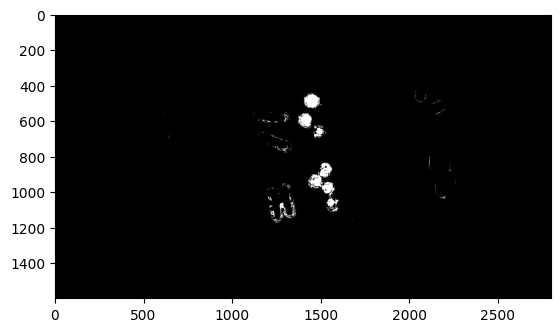

In [87]:
h, s, v = cv2.split(hsv_calib)
binary_calib = cv2.threshold(h, 20, 120, cv2.THRESH_BINARY_INV)[1]
plt.imshow(binary_calib, cmap='gray')

In [88]:
norm = stats.norm(loc=12, scale=2).pdf(np.linspace(-3, 3, 100))

[60 60 60 60 60 60 60 60 60 60 60 67 67 67 67 67 67 67 70 70 70 70 70 70
 70 70 70 72 72 72 72 72 72 72 72 72 72 72 73 73 73 73 73 74 74 74 74 75
 75 75 75 76 76 76 77 77 77 78 78 78 78 78 79 79 80 80 80 80 80 81 81 82
 82 82 82 83 83 83 83 84 84 84 85 85 85 85 86 86 86 86 87 87 87 88 88 88
 88 89 89 89 90 90 90 91 91 91 91 91 92 92 92 92 92 93 93 93 93 93 93 93
 93 94 94 94 94 94 94 94 94 94 95 95 95 95 95 96 96 96 96 96 96 96 96 96
 96 96 96 97 97 97 97 97 97 97 97 97 97 97 97 97 97 98 98 98 98 98 98 98
 98 98 98 98 98 98 98 98 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99
 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99
 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99
 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]


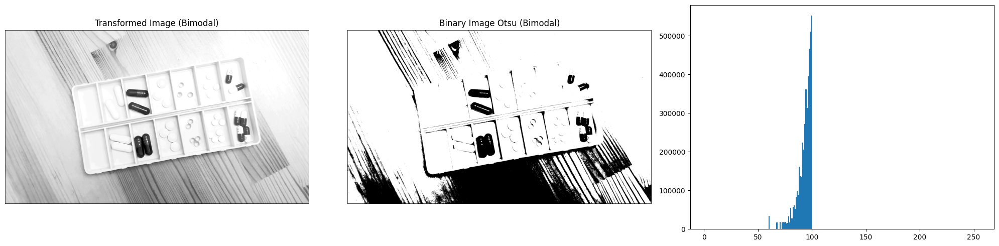

In [89]:
bim_cdf = np.cumsum(norm)
bin_norm = bim_cdf / bim_cdf[-1]

hist, b = np.histogram(calib_grey, 256)
cumsum = hist.cumsum()
cdf_normalized = cumsum / cumsum[-1]*255
cdf_normalized = cdf_normalized.astype('uint8')

x = np.arange(256)
target_cdf = bin_norm
target_normalized = np.round(target_cdf * 255).astype('uint8')
lut = np.searchsorted(target_normalized, cdf_normalized).astype('uint8')
print(lut)
transformed_image = cv2.LUT(calib_grey, lut)

_, otsu_binary_image = cv2.threshold(transformed_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

plt.figure(figsize=(20, 5))
plt.subplot(1, 3, 1)
plt.imshow(transformed_image, cmap='gray')
plt.title('Transformed Image (Bimodal)')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(otsu_binary_image, cmap='gray')
plt.title('Binary Image Otsu (Bimodal)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.hist(transformed_image.flatten(), 256, [0, 256])

plt.tight_layout()
plt.show()

# CARBON

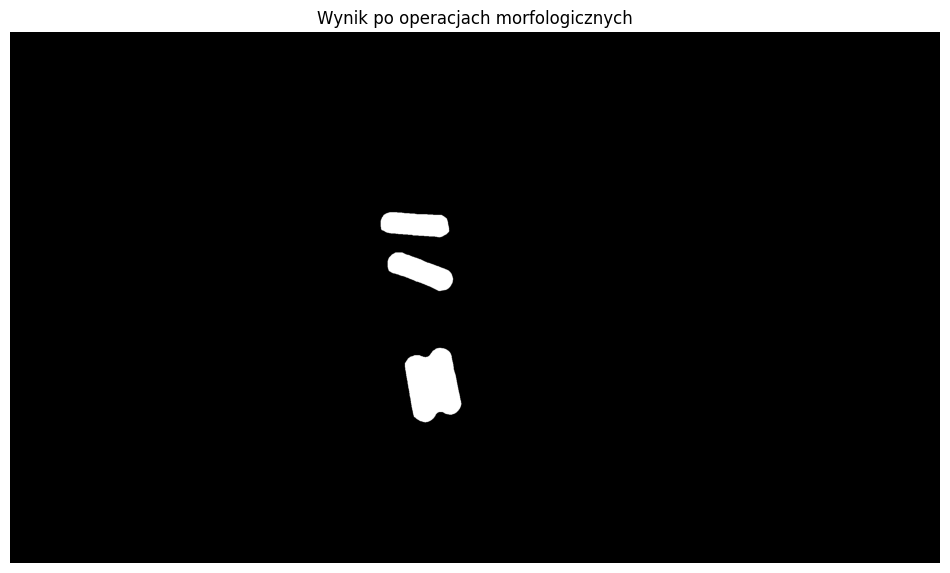

In [6]:
h, s, v = cv2.split(hsv_calib)
binary_calib = cv2.threshold(v, 50, 255, cv2.THRESH_BINARY_INV)[1]

ellipse_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
ellipse_kernel2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))

open_mask = cv2.morphologyEx(binary_calib, cv2.MORPH_OPEN, ellipse_kernel)
closed_mask = cv2.morphologyEx(open_mask, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (30, 30)))
carbon_mask = closed_mask.copy()

plt.figure(figsize=(12, 8))
plt.imshow(closed_mask, cmap='gray')
plt.title("Wynik po operacjach morfologicznych")
plt.axis("off")
plt.show()


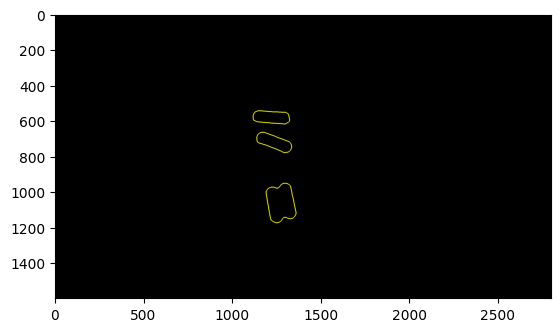

In [7]:
contours, hierarchy = cv2.findContours(closed_mask, cv2.RETR_TREE , cv2.CHAIN_APPROX_SIMPLE)
display = np.zeros_like(calib)
plt.imshow(cv2.drawContours(display, contours, -1, (255, 255, 0), 3))

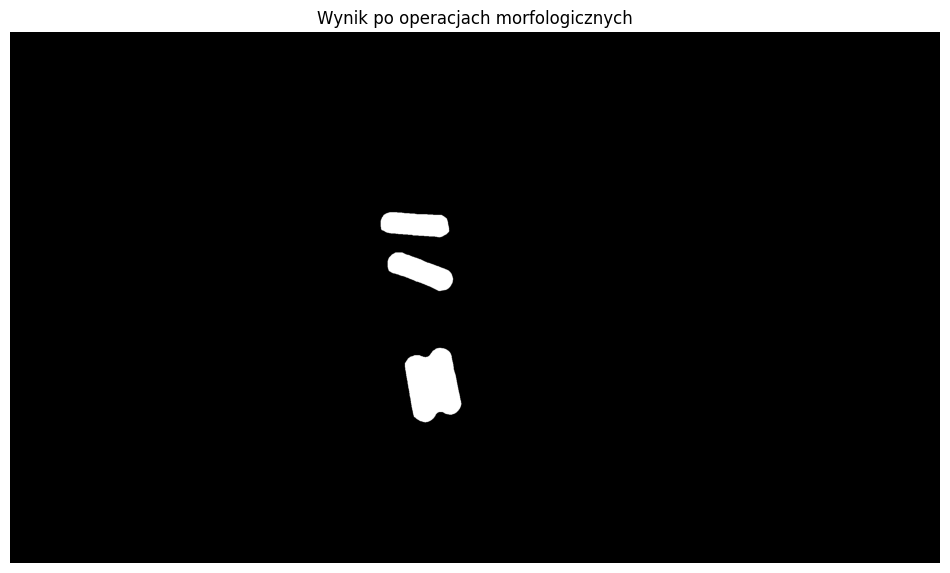

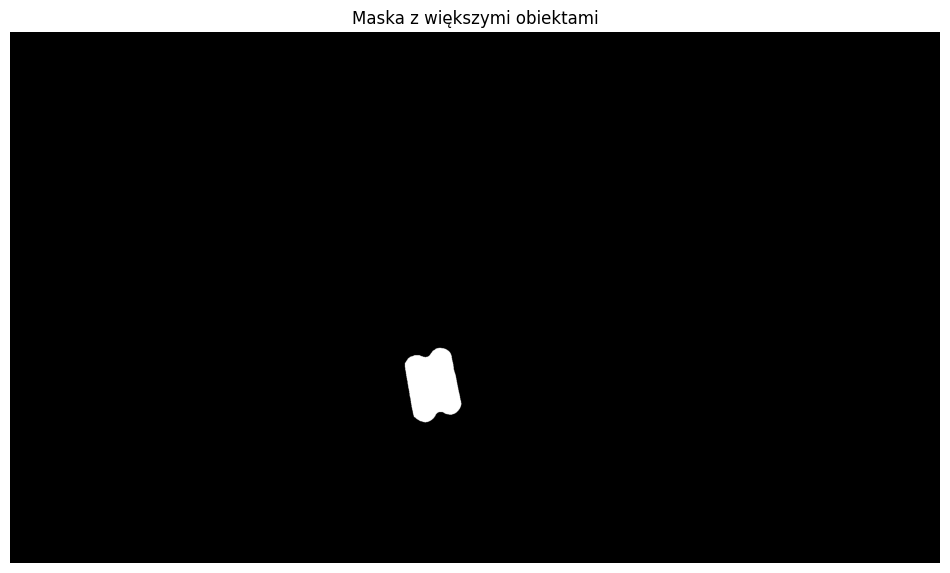

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

h, s, v = cv2.split(hsv_calib)
binary_calib = cv2.threshold(v, 50, 255, cv2.THRESH_BINARY_INV)[1]

ellipse_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
ellipse_kernel2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))

open_mask = cv2.morphologyEx(binary_calib, cv2.MORPH_OPEN, ellipse_kernel)
closed_mask = cv2.morphologyEx(open_mask, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (30, 30)))

plt.figure(figsize=(12, 8))
plt.imshow(closed_mask, cmap='gray')
plt.title("Wynik po operacjach morfologicznych")
plt.axis("off")
plt.show()


contours, _ = cv2.findContours(closed_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

areas = [cv2.contourArea(contour) for contour in contours]

max_area = max(areas)

threshold_area = max_area / 1.5  

filtered_mask = np.zeros_like(closed_mask)

for contour, area in zip(contours, areas):
    if area >= threshold_area:
        cv2.drawContours(filtered_mask, [contour], -1, 255, thickness=cv2.FILLED)
plt.figure(figsize=(12, 8))
plt.imshow(filtered_mask, cmap='gray')
plt.title("Maska z większymi obiektami")
plt.axis("off")
plt.show()


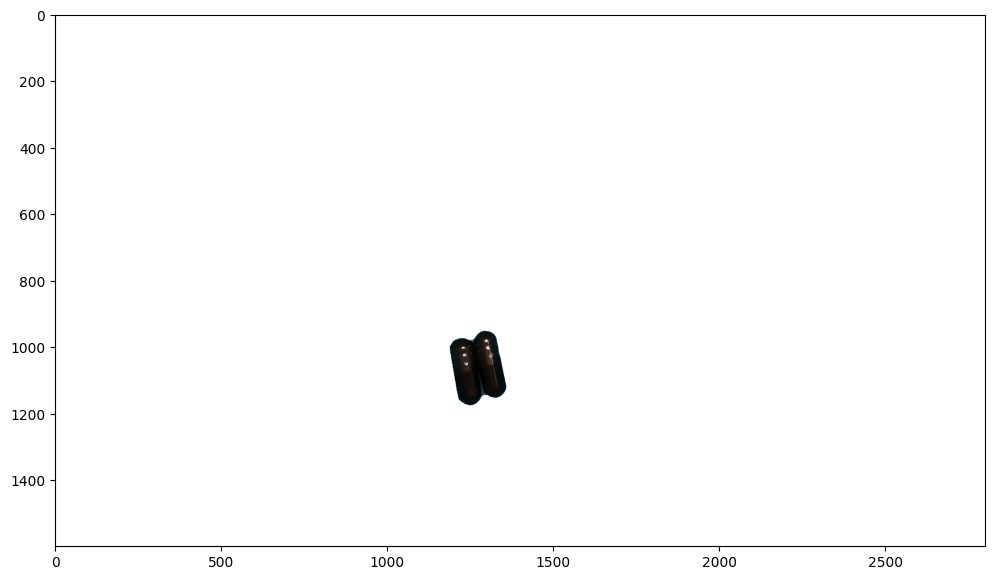

In [9]:
inverted_mask = cv2.bitwise_not(filtered_mask)
new_image = new_image = np.ones_like(calib) * 255
new_image[inverted_mask == 0] = calib[inverted_mask == 0]
plt.figure(figsize=(12, 8))
plt.imshow(new_image)

In [10]:
def rhotheta2xy(line):
    # konwersja parametrów prostej w układzie rho-theta do odcinka w układzie kartezjańskim
    # wynik można użyć jako argumenty funkcji cv2.line
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 5000*(-b))
    y1 = int(y0 + 5000*(a))
    x2 = int(x0 - 5000*(-b))
    y2 = int(y0 - 5000*(a))
    return x1, y1, x2, y2

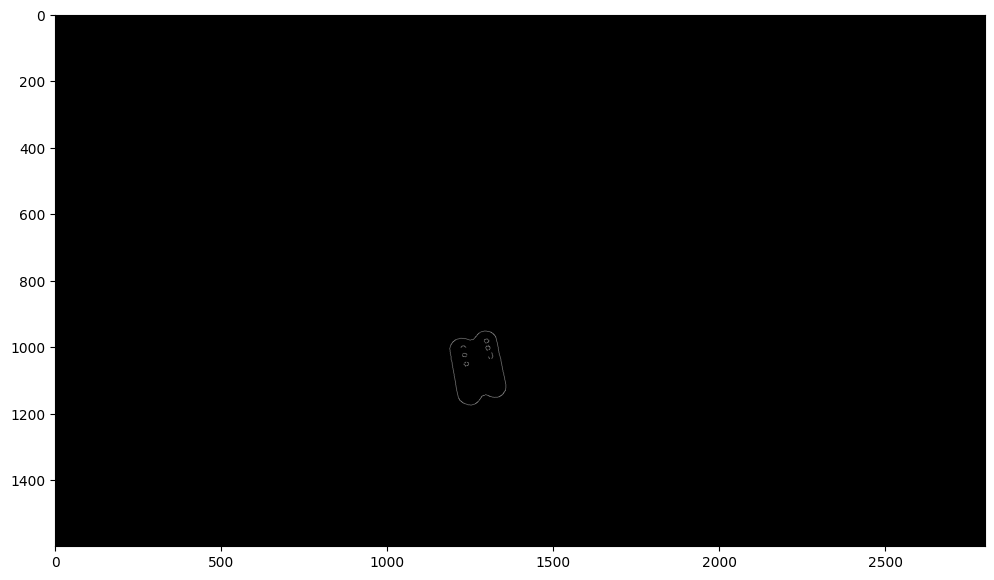

In [19]:
new_image_blur = cv2.GaussianBlur(cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY), (31, 31), 0)
edges = cv2.Canny(new_image_blur, 50, 60, apertureSize=3)
plt.figure(figsize=(12, 8))
plt.imshow(edges, cmap='gray')

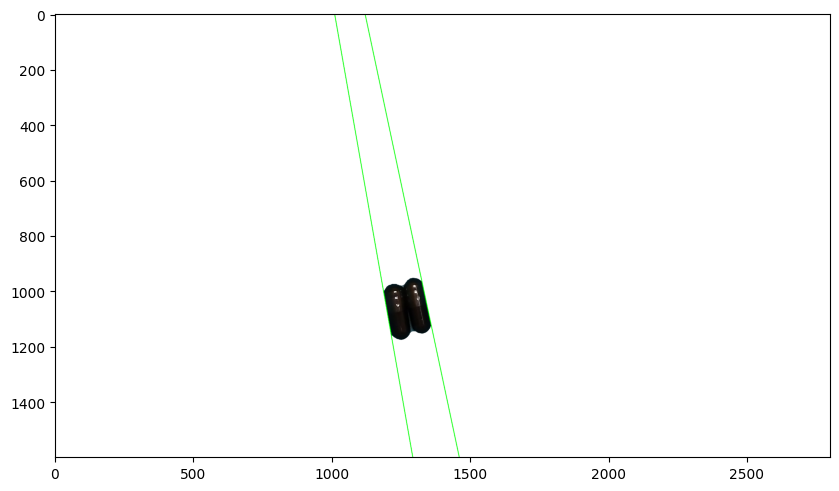

In [22]:
lines = cv2.HoughLines(edges, 1, np.pi/180, 70)
line_image = np.copy(new_image) 
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = rhotheta2xy(line)  
        cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.figure(figsize=(10,10))
plt.imshow(line_image);

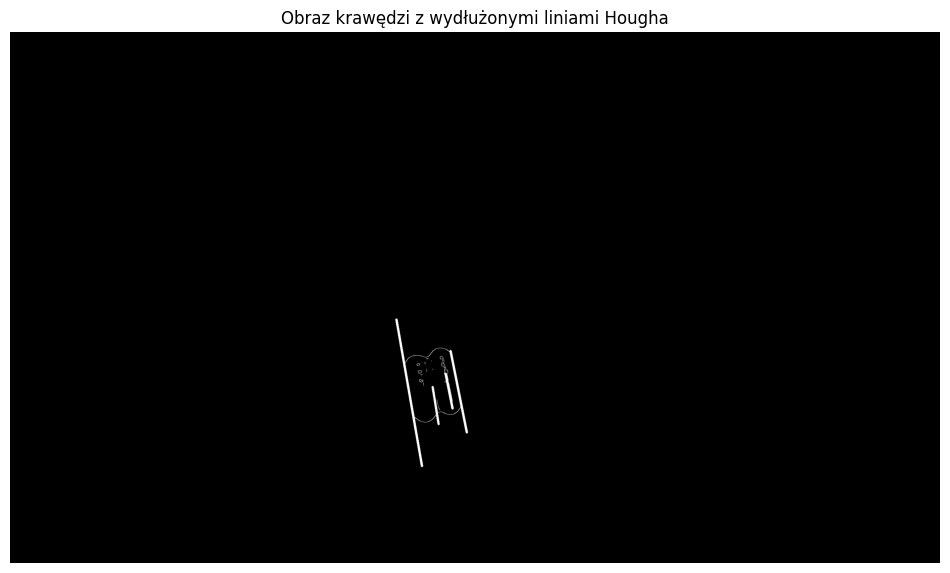

In [38]:
new_image_blur = cv2.GaussianBlur(cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY), (9, 9), 0)
edges = cv2.Canny(new_image_blur, 50, 60, apertureSize=3)

lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=30, minLineLength=5, maxLineGap=2)

min_distance = 20
min_angle_diff = 10  

def distance(p1, p2):
    return np.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

def angle_of_line(x1, y1, x2, y2):
    return np.arctan2(y2 - y1, x2 - x1) * 180 / np.pi 

def parallel_line_distance(line1, line2):
    x1, y1, x2, y2 = line1
    x3, y3, x4, y4 = line2

    angle1 = angle_of_line(x1, y1, x2, y2)
    angle2 = angle_of_line(x3, y3, x4, y4)
    
    if abs(angle1 - angle2) < min_angle_diff:
        a = y2 - y1
        b = x1 - x2
        c = x2 * y1 - x1 * y2

        distance = abs(a * x3 + b * y3 + c) / np.sqrt(a**2 + b**2)
        
        return distance
    else:
        return None

drawn_lines = []

if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        
        dx = x2 - x1
        dy = y2 - y1
        
        line_length = np.sqrt(dx**2 + dy**2)
        
        scale = 1.25  
        
        new_x1 = int(x1 - scale * dx)
        new_y1 = int(y1 - scale * dy)
        new_x2 = int(x2 + scale * dx)
        new_y2 = int(y2 + scale * dy)
        
        too_close = False
        for prev_line in drawn_lines:
            dist = parallel_line_distance(prev_line, (new_x1, new_y1, new_x2, new_y2))
            if dist is not None and dist < min_distance:
                too_close = True
                break
        
        if not too_close:
            cv2.line(edges, (new_x1, new_y1), (new_x2, new_y2), 255, 5)  
            drawn_lines.append((new_x1, new_y1, new_x2, new_y2))  

plt.figure(figsize=(12, 10))
plt.title("Obraz krawędzi z wydłużonymi liniami Hougha")
plt.imshow(edges, cmap='gray')
plt.axis("off")
plt.show()


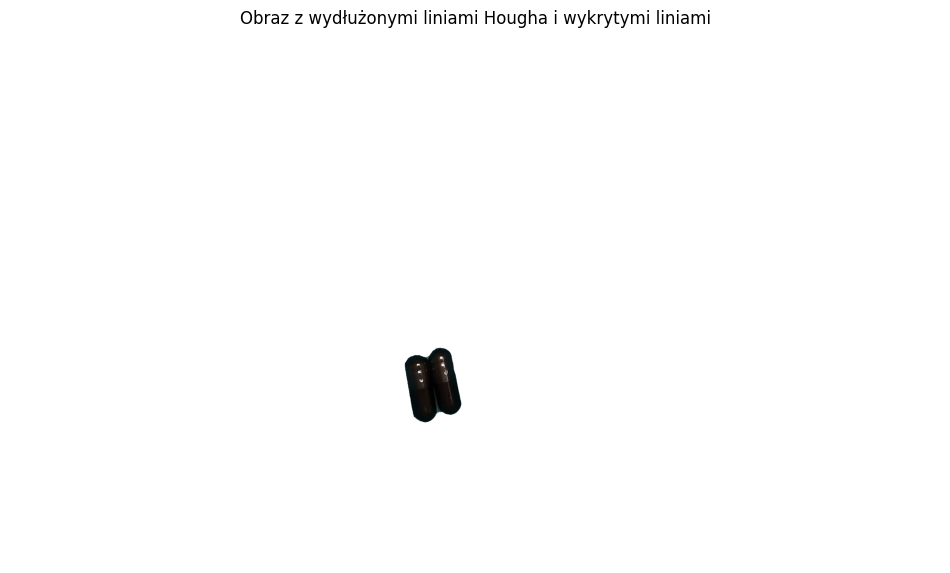

In [39]:
new_image_blur = cv2.GaussianBlur(cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY), (9, 9), 0)
edges = cv2.Canny(new_image_blur, 50, 60, apertureSize=3)

lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=30, minLineLength=5, maxLineGap=2)

min_distance = 20
min_angle_diff = 10  

def distance(p1, p2):
    return np.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

def angle_of_line(x1, y1, x2, y2):
    return np.arctan2(y2 - y1, x2 - x1) * 180 / np.pi 

def parallel_line_distance(line1, line2):
    x1, y1, x2, y2 = line1
    x3, y3, x4, y4 = line2
    
    angle1 = angle_of_line(x1, y1, x2, y2)
    angle2 = angle_of_line(x3, y3, x4, y4)
    
    if abs(angle1 - angle2) < min_angle_diff:

        a = y2 - y1
        b = x1 - x2
        c = x2 * y1 - x1 * y2
    
        distance = abs(a * x3 + b * y3 + c) / np.sqrt(a**2 + b**2)
        
        return distance
    else:
        return None

drawn_lines = []

if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        
        dx = x2 - x1
        dy = y2 - y1
        
        line_length = np.sqrt(dx**2 + dy**2)

        scale = 1.25 
        
        new_x1 = int(x1 - scale * dx)
        new_y1 = int(y1 - scale * dy)
        new_x2 = int(x2 + scale * dx)
        new_y2 = int(y2 + scale * dy)
        
        too_close = False
        for prev_line in drawn_lines:
            dist = parallel_line_distance(prev_line, (new_x1, new_y1, new_x2, new_y2))
            if dist is not None and dist < min_distance:
                too_close = True
                break

        if not too_close:
            drawn_lines.append((new_x1, new_y1, new_x2, new_y2))  

final_lines = []
for line in drawn_lines:
    x1, y1, x2, y2 = line
    is_similar = False
    for prev_line in final_lines:
        if parallel_line_distance(prev_line, (x1, y1, x2, y2)) is not None:
            is_similar = True
            break
    
    if is_similar:
        final_lines.append(line)

final_image = np.copy(new_image)
for line in final_lines:
    x1, y1, x2, y2 = line
    cv2.line(final_image, (x1, y1), (x2, y2), (0, 255, 0), 2)  


contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


plt.figure(figsize=(12, 10))
plt.title("Obraz z wydłużonymi liniami Hougha i wykrytymi liniami")
plt.imshow(final_image)
plt.axis("off")
plt.show()


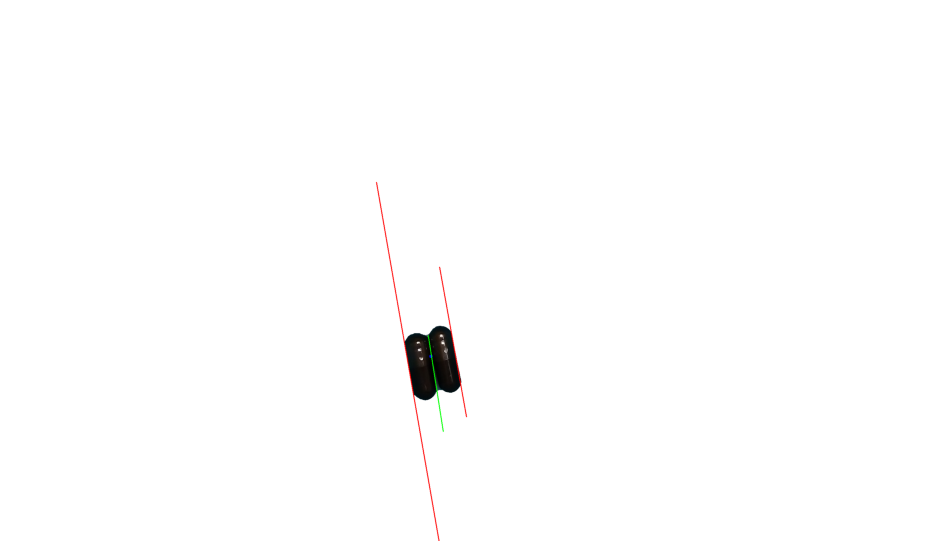

In [44]:
new_image_blur = cv2.GaussianBlur(cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY), (9, 9), 0)
edges = cv2.Canny(new_image_blur, 50, 60, apertureSize=3)

lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=30, minLineLength=5, maxLineGap=2)

min_distance = 20
min_angle_diff = 20  

def angle_of_line(x1, y1, x2, y2):
    return np.arctan2(y2 - y1, x2 - x1) * 180 / np.pi  

def distance(p1, p2):
    return np.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

def parallel_line_distance(line1, line2):
    x1, y1, x2, y2 = line1
    x3, y3, x4, y4 = line2
    
    angle1 = angle_of_line(x1, y1, x2, y2)
    angle2 = angle_of_line(x3, y3, x4, y4)

    if abs(angle1 - angle2) < min_angle_diff:
        a = y2 - y1
        b = x1 - x2
        c = x2 * y1 - x1 * y2
        
        distance = abs(a * x3 + b * y3 + c) / np.sqrt(a**2 + b**2)
        
        return distance
    else:
        return None

drawn_lines = []
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        
        dx = x2 - x1
        dy = y2 - y1
        
        line_length = np.sqrt(dx**2 + dy**2)
        
        scale = 4
        
        new_x1 = int(x1 - scale * dx)
        new_y1 = int(y1 - scale * dy)
        new_x2 = int(x2 + scale * dx)
        new_y2 = int(y2 + scale * dy)
        
        drawn_lines.append((new_x1, new_y1, new_x2, new_y2))  

max_distance = 0
extreme_lines = (None, None)  

for i, line1 in enumerate(drawn_lines):
    for j, line2 in enumerate(drawn_lines):
        if i != j:
            dist = parallel_line_distance(line1, line2)
            if dist is not None and dist > max_distance:
                max_distance = dist
                extreme_lines = (line1, line2)

centers = []
for line in extreme_lines:
    if line is not None:
        x1, y1, x2, y2 = line
        center_x = (x1 + x2) // 2
        center_y = (y1 + y2) // 2
        centers.append((center_x, center_y))


if len(centers) == 2:

    x1, y1 = centers[0]
    x2, y2 = centers[1]
    
    midpoint_x = (x1 + x2) // 2
    midpoint_y = (y1 + y2) // 2
    midpoint = (midpoint_x, midpoint_y)

    final_image = np.copy(new_image)
    cv2.circle(final_image, midpoint, 5, (0, 0, 255), -1)  

    for line in drawn_lines:
        if line != extreme_lines[0] and line != extreme_lines[1]:
            x1, y1, x2, y2 = line
            for x in range(min(x1, x2), max(x1, x2)):
                y = int(((y2 - y1) * (x - x1)) / (x2 - x1) + y1) 
                
                if abs(x - midpoint_x) < 5 and abs(y - midpoint_y) < 5:
                    cv2.line(final_image, (x1, y1), (x2, y2), (0, 255, 0), 2)  

    for line in extreme_lines:
        if line is not None:
            x1, y1, x2, y2 = line
            cv2.line(final_image, (x1, y1), (x2, y2), (255, 0, 0), 2)  
    
    plt.figure(figsize=(12, 10))
    plt.imshow(final_image)
    plt.axis("off")
    plt.show()


Liczba konturów: 3


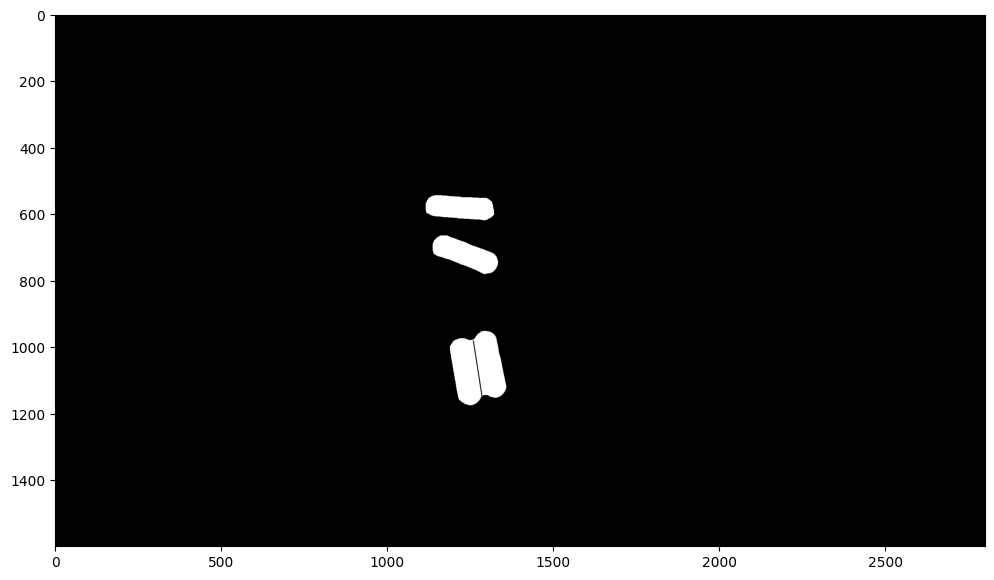

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

h, s, v = cv2.split(hsv_calib)
binary_calib = cv2.threshold(v, 50, 255, cv2.THRESH_BINARY_INV)[1]

ellipse_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
ellipse_kernel2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))

open_mask = cv2.morphologyEx(binary_calib, cv2.MORPH_OPEN, ellipse_kernel)
closed_mask = cv2.morphologyEx(open_mask, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (30, 30)))

inverted_mask = cv2.bitwise_not(filtered_mask)
new_image = new_image = np.ones_like(calib) * 255
new_image[inverted_mask == 0] = calib[inverted_mask == 0]

contours, _ = cv2.findContours(closed_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

areas = [cv2.contourArea(contour) for contour in contours]

max_area = max(areas)

threshold_area = max_area / 1.5  
filtered_mask = np.zeros_like(closed_mask)

for contour, area in zip(contours, areas):
    if area >= threshold_area:
        cv2.drawContours(filtered_mask, [contour], -1, 255, thickness=cv2.FILLED)

new_image_blur = cv2.GaussianBlur(cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY), (9, 9), 0)
edges = cv2.Canny(new_image_blur, 50, 60, apertureSize=3)

lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=30, minLineLength=5, maxLineGap=2)

min_distance = 20
min_angle_diff = 20  

def angle_of_line(x1, y1, x2, y2):
    return np.arctan2(y2 - y1, x2 - x1) * 180 / np.pi  

def distance(p1, p2):
    return np.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

def parallel_line_distance(line1, line2):
    x1, y1, x2, y2 = line1
    x3, y3, x4, y4 = line2
    
    angle1 = angle_of_line(x1, y1, x2, y2)
    angle2 = angle_of_line(x3, y3, x4, y4)
    
    if abs(angle1 - angle2) < min_angle_diff:
        a = y2 - y1
        b = x1 - x2
        c = x2 * y1 - x1 * y2
        
        distance = abs(a * x3 + b * y3 + c) / np.sqrt(a**2 + b**2)
        
        return distance
    else:
        return None

drawn_lines = []
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        

        dx = x2 - x1
        dy = y2 - y1
    
        line_length = np.sqrt(dx**2 + dy**2)
        
        scale = 4

        new_x1 = int(x1 - scale * dx)
        new_y1 = int(y1 - scale * dy)
        new_x2 = int(x2 + scale * dx)
        new_y2 = int(y2 + scale * dy)
        
        drawn_lines.append((new_x1, new_y1, new_x2, new_y2))  

max_distance = 0
extreme_lines = (None, None)  

for i, line1 in enumerate(drawn_lines):
    for j, line2 in enumerate(drawn_lines):
        if i != j:

            dist = parallel_line_distance(line1, line2)
            if dist is not None and dist > max_distance:
                max_distance = dist
                extreme_lines = (line1, line2)

centers = []
for line in extreme_lines:
    if line is not None:
        x1, y1, x2, y2 = line
        center_x = (x1 + x2) // 2
        center_y = (y1 + y2) // 2
        centers.append((center_x, center_y))

if len(centers) == 2:

    x1, y1 = centers[0]
    x2, y2 = centers[1]

    midpoint_x = (x1 + x2) // 2
    midpoint_y = (y1 + y2) // 2
    midpoint = (midpoint_x, midpoint_y)

    new_image_with_lines = np.copy(new_image)

    for line in drawn_lines:
        if line != extreme_lines[0] and line != extreme_lines[1]:
            x1, y1, x2, y2 = line
            for x in range(min(x1, x2), max(x1, x2)):
                y = int(((y2 - y1) * (x - x1)) / (x2 - x1) + y1)  

                if abs(x - midpoint_x) < 5 and abs(y - midpoint_y) < 5:
                    cv2.line(closed_mask, (x1, y1), (x2, y2), (0, 0, 0), 2) 

    new_image_gray = cv2.cvtColor(new_image_with_lines, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(new_image_gray, 50, 255, cv2.THRESH_BINARY)
    
    contours, hierarchy = cv2.findContours(closed_mask, cv2.RETR_TREE , cv2.CHAIN_APPROX_SIMPLE)
    display = np.zeros_like(calib)
    
    new_image_contours = np.copy(new_image_with_lines)
    cv2.drawContours(new_image_contours, contours, -1, (0, 255, 0), 2)  

    closed_mask_with_lines = np.copy(closed_mask)
    
    extreme_lines = list(extreme_lines)  
    
    for line in extreme_lines + drawn_lines:
        if line is not None:
            x1, y1, x2, y2 = line
            cv2.line(closed_mask_with_lines, (x1, y1), (x2, y2), (255, 255, 255), 2)  

    contours = cv2.findContours(closed_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)[0]
    print(f"Liczba konturów: {len(contours)}")

    plt.figure(figsize=(12, 10))
    plt.imshow(closed_mask, cmap='gray')

# PROBIO

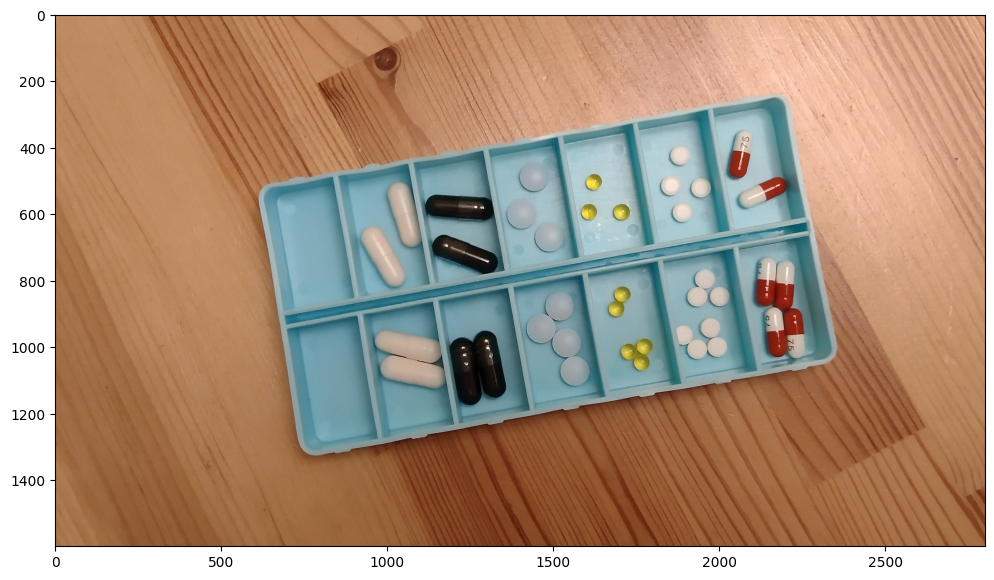

In [101]:
calib = cv2.imread('calib.png')[..., ::-1]
plt.subplots(1, 1, figsize=(12,8))[1].imshow(calib);

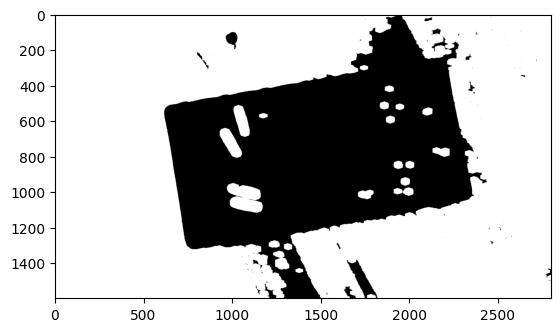

In [102]:
hsv = cv2.cvtColor(calib, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv)
h_lower = 10
h_upper = 30
thresh = cv2.inRange(h, h_lower, h_upper)
opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 5)), iterations=7)
plt.imshow(opened, cmap='gray')

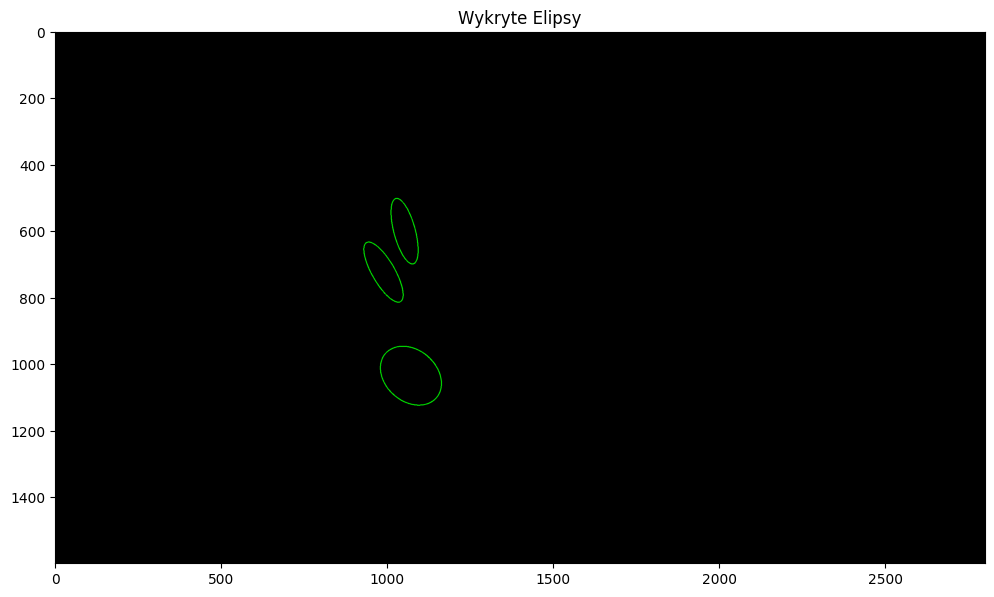

In [103]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

hsv = cv2.cvtColor(calib, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv)

h_lower = 10
h_upper = 30

thresh = cv2.inRange(h, h_lower, h_upper)

opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 5)), iterations=7)

contours, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

output_image = np.zeros_like(calib) 

for contour in contours:
    if len(contour) >= 5:  
        ellipse = cv2.fitEllipse(contour)
        center, axes, angle = ellipse
        if 500 > axes[0] > 50 and 700 > axes[1] > 150 :
            cv2.ellipse(output_image, ellipse, (0, 255, 0), 2)  

plt.figure(figsize=(12, 8))
plt.imshow(output_image) 
plt.title("Wykryte Elipsy")
plt.show()


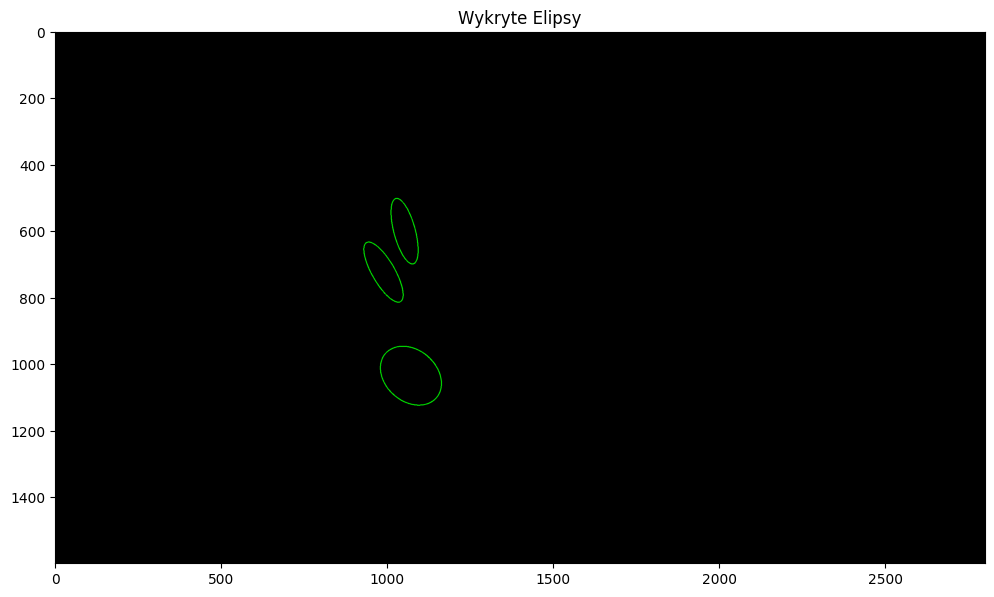

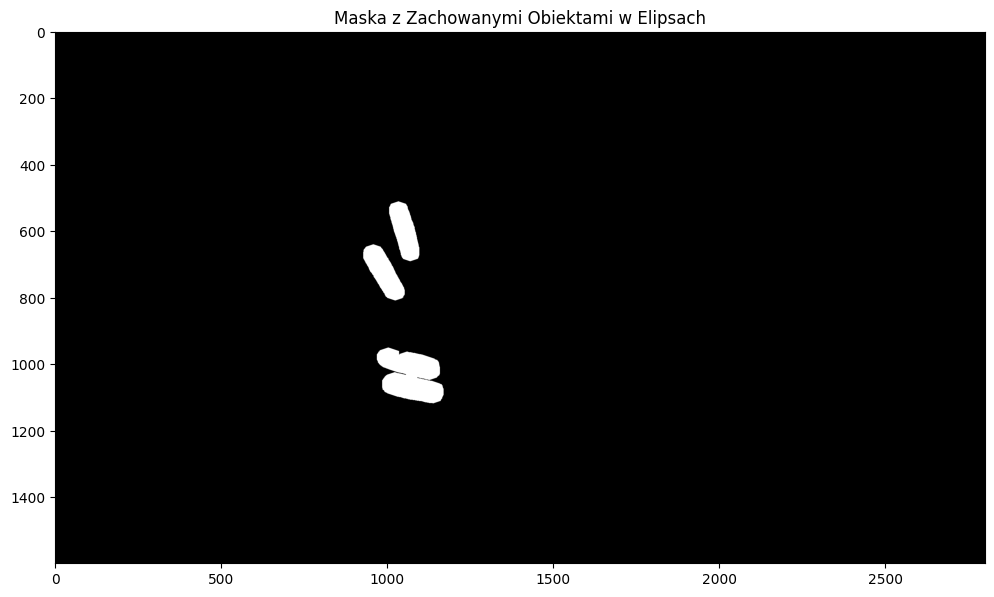

In [104]:
output_image = np.zeros_like(calib) 
final_mask = np.zeros_like(opened) 

for contour in contours:
    if len(contour) >= 5:  
        ellipse = cv2.fitEllipse(contour)
        center, axes, angle = ellipse
        
        if 500 > axes[0] > 50 and 500 > axes[1] > 150:
            cv2.ellipse(output_image, ellipse, (0, 255, 0), 2) 

            for y in range(0, opened.shape[0]):
                for x in range(0, opened.shape[1]):
                    if cv2.pointPolygonTest(contour, (x, y), False) >= 0: 
                        if opened[y, x] == 255:
                            final_mask[y, x] = 255 
                        else:
                            final_mask[y, x] = 0

probio_mask = final_mask.copy()

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)) 
plt.title("Wykryte Elipsy")
plt.show()

plt.figure(figsize=(12, 8))
plt.imshow(final_mask, cmap='gray')
plt.title("Maska z Zachowanymi Obiektami w Elipsach")
plt.show()


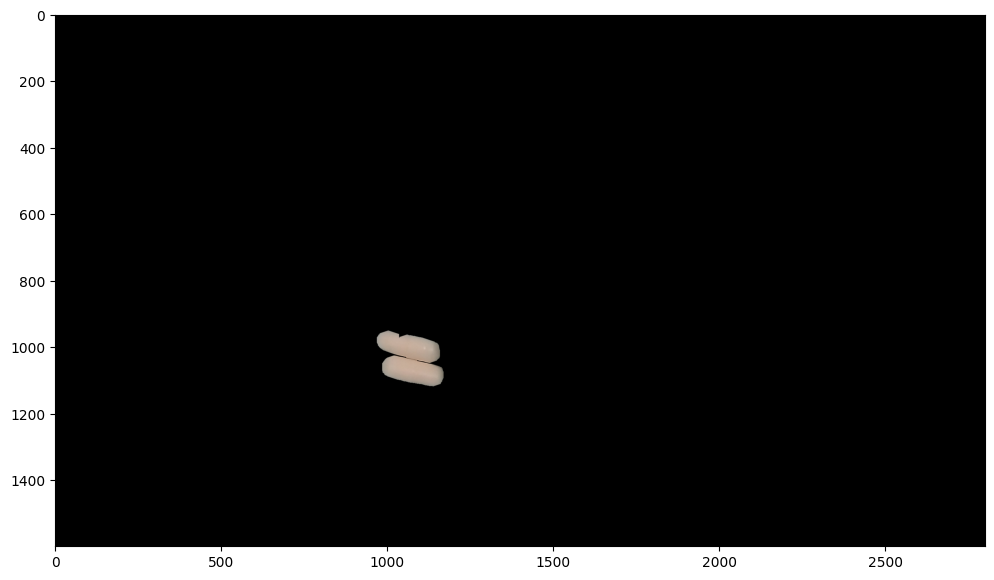

In [105]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

contours, _ = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)

    largest_object_mask = np.zeros_like(final_mask) 
    cv2.drawContours(largest_object_mask, [largest_contour], -1, 255, thickness=cv2.FILLED) 

    calib_masked = cv2.bitwise_and(calib, calib, mask=largest_object_mask)

    plt.figure(figsize=(12, 8))
    plt.imshow(calib_masked)
    plt.show()
else:
    print("Brak konturów w final_mask")


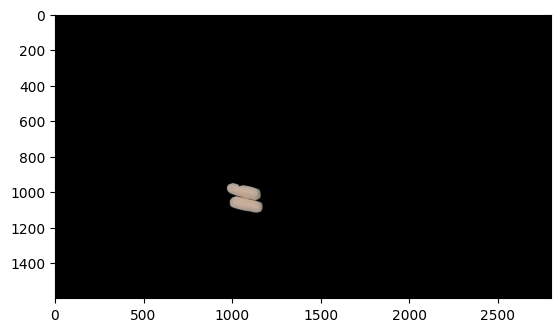

In [106]:
plt.imshow(calib_masked)

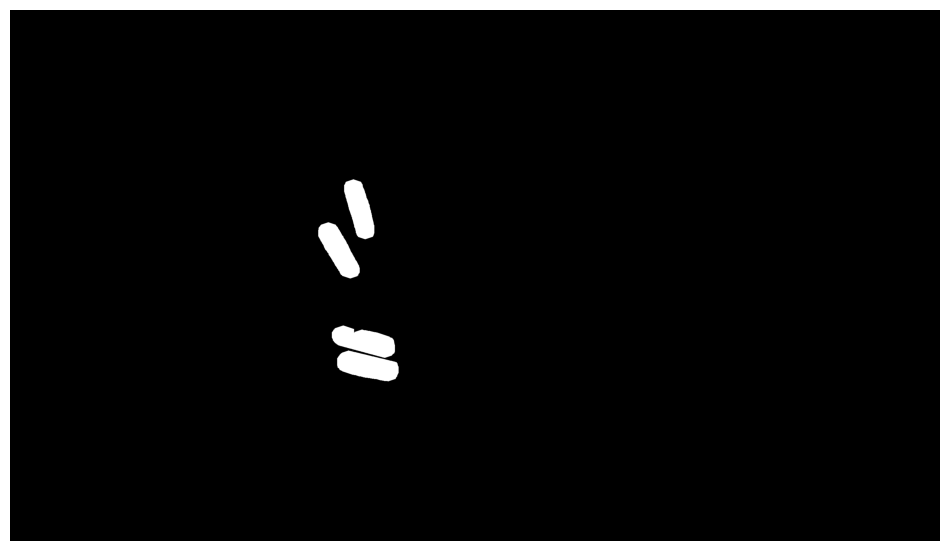

In [107]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

edges = cv2.Canny(calib_masked, 25, 50)

lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=40, minLineLength=50, maxLineGap=5)

min_distance = 20
min_angle_diff = 20  

def angle_of_line(x1, y1, x2, y2):
    return np.arctan2(y2 - y1, x2 - x1) * 180 / np.pi  

def distance(p1, p2):
    return np.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

def parallel_line_distance(line1, line2):
    x1, y1, x2, y2 = line1
    x3, y3, x4, y4 = line2
    
    angle1 = angle_of_line(x1, y1, x2, y2)
    angle2 = angle_of_line(x3, y3, x4, y4)

    if abs(angle1 - angle2) < min_angle_diff:
        a = y2 - y1
        b = x1 - x2
        c = x2 * y1 - x1 * y2
        
        distance = abs(a * x3 + b * y3 + c) / np.sqrt(a**2 + b**2)
        
        return distance
    else:
        return None

drawn_lines = []
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        
        dx = x2 - x1
        dy = y2 - y1
        
        line_length = np.sqrt(dx**2 + dy**2)
        
        scale = 1.25 
        
        new_x1 = int(x1 - scale * dx)
        new_y1 = int(y1 - scale * dy)
        new_x2 = int(x2 + scale * dx)
        new_y2 = int(y2 + scale * dy)
        
        drawn_lines.append((new_x1, new_y1, new_x2, new_y2))  

max_distance = 0
extreme_lines = (None, None)  

for i, line1 in enumerate(drawn_lines):
    for j, line2 in enumerate(drawn_lines):
        if i != j:
            dist = parallel_line_distance(line1, line2)
            if dist is not None and dist > max_distance:
                max_distance = dist
                extreme_lines = (line1, line2)

centers = []
for line in extreme_lines:
    if line is not None:
        x1, y1, x2, y2 = line
        center_x = (x1 + x2) // 2
        center_y = (y1 + y2) // 2
        centers.append((center_x, center_y))


if len(centers) == 2:

    x1, y1 = centers[0]
    x2, y2 = centers[1]
    
    midpoint_x = (x1 + x2) // 2
    midpoint_y = (y1 + y2) // 2
    midpoint = (midpoint_x, midpoint_y)

    final_image = np.copy(calib_masked)
    cv2.circle(final_image, midpoint, 5, (0, 0, 255), -1)  

    for line in drawn_lines:
        if line != extreme_lines[0] and line != extreme_lines[1]:
            x1, y1, x2, y2 = line
            for x in range(min(x1, x2), max(x1, x2)):
                y = int(((y2 - y1) * (x - x1)) / (x2 - x1) + y1) 
                
                if abs(x - midpoint_x) < 5 and abs(y - midpoint_y) < 5:
                    cv2.line(probio_mask, (x1, y1), (x2, y2), (0, 255, 0), 2)  

    for line in extreme_lines:
        if line is not None:
            x1, y1, x2, y2 = line
            cv2.line(final_image, (x1, y1), (x2, y2), (255, 0, 0), 2)  
    
    plt.figure(figsize=(12, 10))
    plt.imshow(probio_mask, cmap='gray')
    plt.axis("off")
    plt.show()


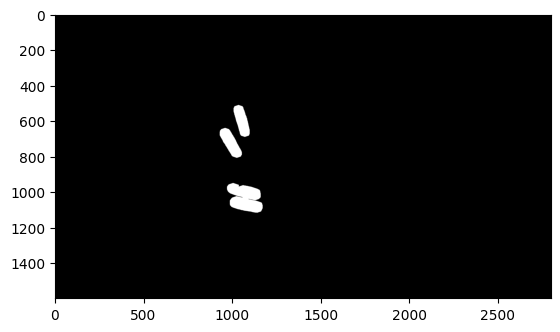

In [108]:
hsv = cv2.cvtColor(calib, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv)

h_lower = 10
h_upper = 30

thresh = cv2.inRange(h, h_lower, h_upper)

opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 5)), iterations=5)

output_image = np.zeros_like(calib)  
final_mask = np.zeros_like(opened) 

for contour in contours:
    if len(contour) >= 5: 
        ellipse = cv2.fitEllipse(contour)
        center, axes, angle = ellipse

        if 500 > axes[0] > 50 and 500 > axes[1] > 200:

            cv2.ellipse(output_image, ellipse, (0, 255, 0), 2)  

            for y in range(0, opened.shape[0]):
                for x in range(0, opened.shape[1]):
                    if cv2.pointPolygonTest(contour, (x, y), False) >= 0: 
                        if opened[y, x] == 255:
                            final_mask[y, x] = 255
                        else:
                            final_mask[y, x] = 0 

contours, _ = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)

    largest_object_mask = np.zeros_like(final_mask) 
    cv2.drawContours(largest_object_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)  

    calib_masked = cv2.bitwise_and(calib, calib, mask=largest_object_mask)
edges = cv2.Canny(calib_masked, 25, 50)

lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=60, minLineLength=50, maxLineGap=5)

min_distance = 20
min_angle_diff = 20  

def angle_of_line(x1, y1, x2, y2):
    return np.arctan2(y2 - y1, x2 - x1) * 180 / np.pi  

def distance(p1, p2):
    return np.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

def parallel_line_distance(line1, line2):
    x1, y1, x2, y2 = line1
    x3, y3, x4, y4 = line2
    
    angle1 = angle_of_line(x1, y1, x2, y2)
    angle2 = angle_of_line(x3, y3, x4, y4)

    if abs(angle1 - angle2) < min_angle_diff:
        a = y2 - y1
        b = x1 - x2
        c = x2 * y1 - x1 * y2
        
        distance = abs(a * x3 + b * y3 + c) / np.sqrt(a**2 + b**2)
        
        return distance
    else:
        return None

drawn_lines = []
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        
        dx = x2 - x1
        dy = y2 - y1
        
        line_length = np.sqrt(dx**2 + dy**2)
        
        scale = 1.25 
        
        new_x1 = int(x1 - scale * dx)
        new_y1 = int(y1 - scale * dy)
        new_x2 = int(x2 + scale * dx)
        new_y2 = int(y2 + scale * dy)
        
        drawn_lines.append((new_x1, new_y1, new_x2, new_y2))  

max_distance = 0
extreme_lines = (None, None)  

for i, line1 in enumerate(drawn_lines):
    for j, line2 in enumerate(drawn_lines):
        if i != j:
            dist = parallel_line_distance(line1, line2)
            if dist is not None and dist > max_distance:
                max_distance = dist
                extreme_lines = (line1, line2)

centers = []
for line in extreme_lines:
    if line is not None:
        x1, y1, x2, y2 = line
        center_x = (x1 + x2) // 2
        center_y = (y1 + y2) // 2
        centers.append((center_x, center_y))


if len(centers) == 2:

    x1, y1 = centers[0]
    x2, y2 = centers[1]
    
    midpoint_x = (x1 + x2) // 2
    midpoint_y = (y1 + y2) // 2
    midpoint = (midpoint_x, midpoint_y)

    final_image = np.copy(calib_masked)
    cv2.circle(final_image, midpoint, 5, (0, 0, 255), -1)  

    for line in drawn_lines:
        if line != extreme_lines[0] and line != extreme_lines[1]:
            x1, y1, x2, y2 = line
            for x in range(min(x1, x2), max(x1, x2)):
                y = int(((y2 - y1) * (x - x1)) / (x2 - x1) + y1) 
                
                if abs(x - midpoint_x) < 5 and abs(y - midpoint_y) < 5:
                    cv2.line(final_mask, (x1, y1), (x2, y2), (0, 0, 0), 2)  


plt.imshow(final_mask, cmap='gray')
    
# contours, _ = cv2.findContours(final_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
# print(len(contours))
# new_image = np.zeros_like(calib)
# plt.imshow(cv2.drawContours(final_mask, contours, -1, (0, 255, 0), 2), cmap='gray')

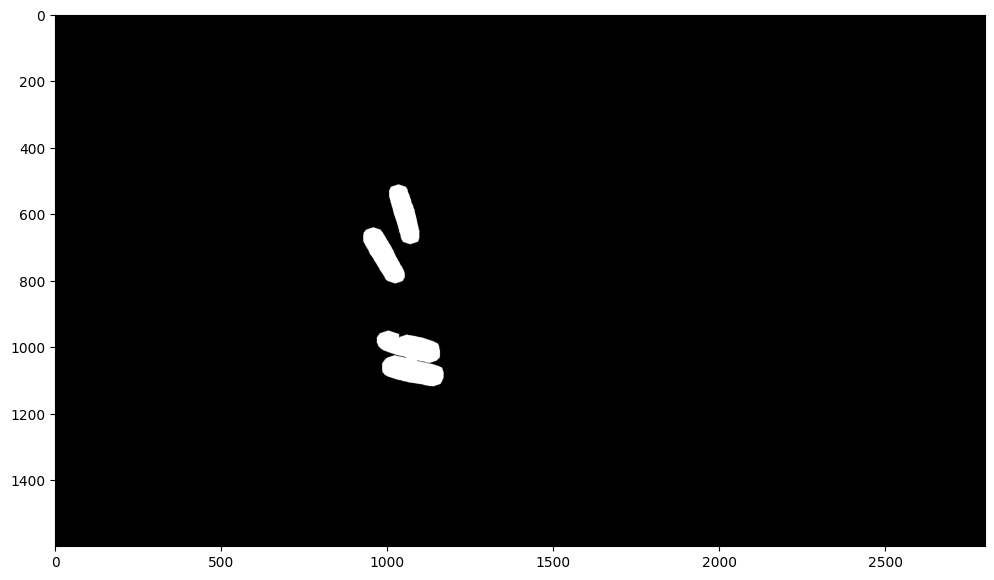

In [109]:
plt.figure(figsize=(12, 8))
plt.imshow(final_mask, cmap='gray')


# KETO

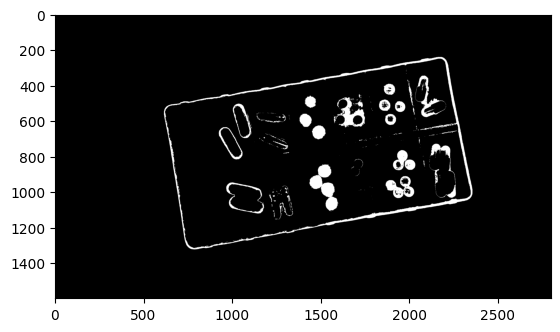

In [110]:
hsv_calib = cv2.cvtColor(calib, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv_calib)
s_threshold = cv2.threshold(s, 30, 100, cv2.THRESH_BINARY_INV)[1]
open = cv2.morphologyEx(s_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9, 9)), iterations=6)
plt.imshow(s_threshold, cmap='gray')

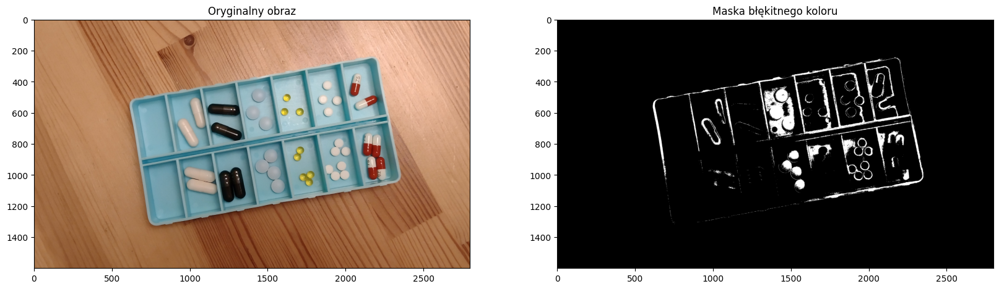

In [111]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

hsv_calib = cv2.cvtColor(calib, cv2.COLOR_RGB2HSV)

lower_blue = np.array([150, 160, 160])  
upper_blue = np.array([200, 200, 200])  
mask_blue = cv2.inRange(calib, lower_blue, upper_blue)

mask_non_blue = cv2.bitwise_not(mask_blue)

non_blue_regions = cv2.bitwise_and(calib, calib, mask=mask_non_blue)

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(calib)
plt.title("Oryginalny obraz")

plt.subplot(1, 2, 2)
plt.imshow(mask_blue, cmap='gray')
plt.title("Maska błękitnego koloru")

plt.show()


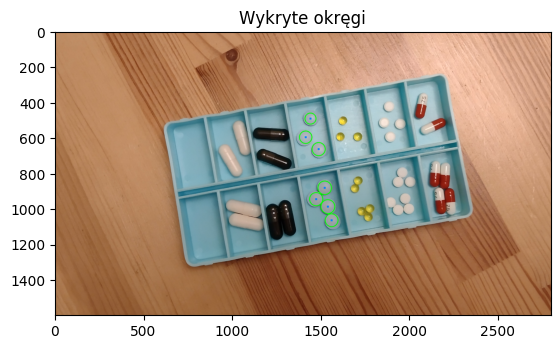

[[1485  665   37]
 [1537  989   39]
 [1519  883   38]
 [1412  598   35]
 [1558 1066   36]
 [1471  947   37]
 [1439  493   31]]


In [113]:
hsv_calib = cv2.cvtColor(calib, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv_calib)
s_threshold = cv2.threshold(s, 33, 36, cv2.THRESH_BINARY_INV)[1]
open = cv2.morphologyEx(s_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7)), iterations=10)

plt.imshow(open, cmap='gray')
new = calib.copy()
gray = open

circles = cv2.HoughCircles(
    gray, 
    cv2.HOUGH_GRADIENT, dp=1.2, minDist=20, param1=200, param2=7, minRadius=30, maxRadius=40
)

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    
    for (x, y, r) in circles:
        
        cv2.circle(new, (x, y), r, (0, 255, 0), 4) 
        cv2.rectangle(new, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)  

plt.imshow(new)
plt.title("Wykryte okręgi")
plt.show()
print(circles)


In [114]:
for x,y,r in circles:
    print(f"Środek okręgu: ({x}, {y}), promień: {r}")

Środek okręgu: (1485, 665), promień: 37
Środek okręgu: (1537, 989), promień: 39
Środek okręgu: (1519, 883), promień: 38
Środek okręgu: (1412, 598), promień: 35
Środek okręgu: (1558, 1066), promień: 36
Środek okręgu: (1471, 947), promień: 37
Środek okręgu: (1439, 493), promień: 31


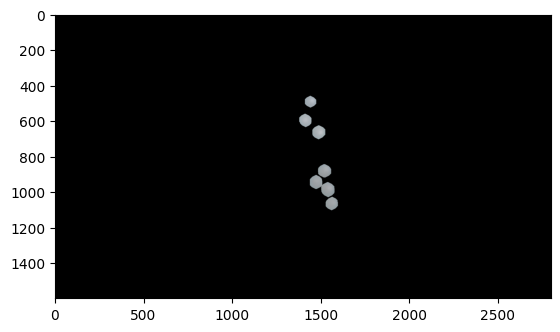

In [115]:
new = calib.copy()
new[open==0] = 0
plt.imshow(new)

[[-1 -1 -1 ... -1 -1 -1]
 [-1  1  1 ...  1  1 -1]
 [-1  1  1 ...  1  1 -1]
 ...
 [-1  1  1 ...  1  1 -1]
 [-1  1  1 ...  1  1 -1]
 [-1 -1 -1 ... -1 -1 -1]]


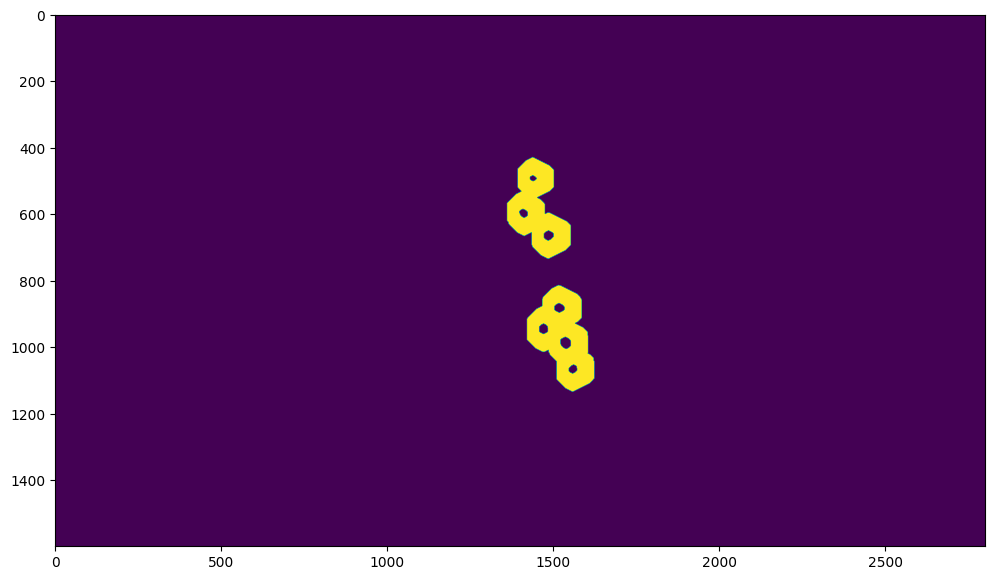

In [116]:
calib_test = calib.copy()
sure_bg = cv2.dilate(open,cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (4, 5)),iterations=15)
dist_transform = cv2.distanceTransform(open,cv2.DIST_L2,5)
ret, sure_fg = cv2.threshold(dist_transform,0.6*dist_transform.max(),255,0)
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)
ret, markers = cv2.connectedComponents(sure_fg)
markers = markers+1
markers[unknown==255] = 0
markers = cv2.watershed(calib,markers)
calib_test[markers == -1] = [255,0,0]
# new = np.zeros_like(calib_test)
# new[markers==-1] = [255,0,0]
plt.figure(figsize=(12, 8))
plt.imshow(unknown)
print(markers)

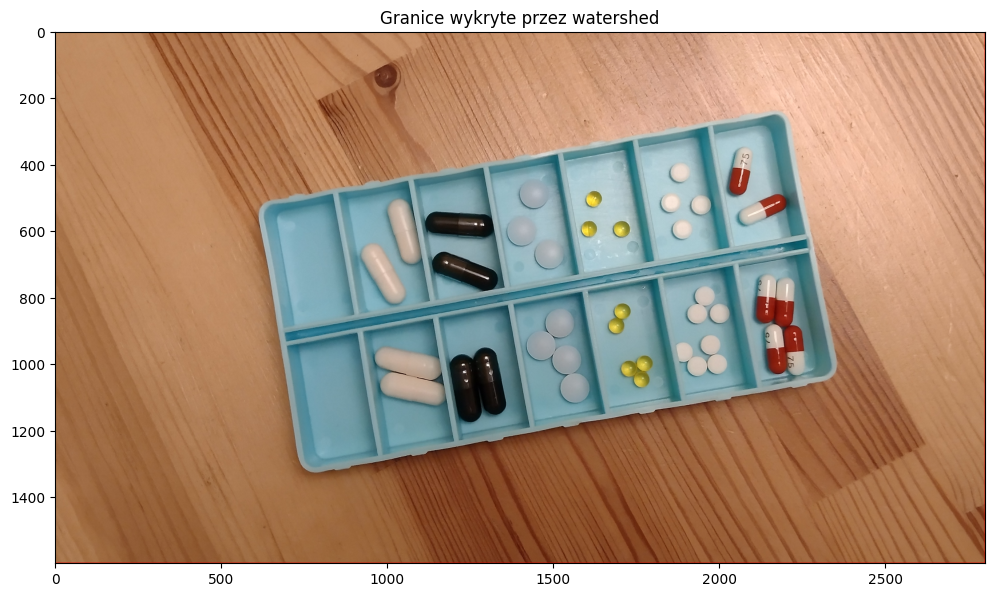

[-1  1  2  3  4  5  6  7  8]


In [117]:
sure_bg = cv2.dilate(open, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (4, 5)), iterations=12)

dist_transform = cv2.distanceTransform(open, cv2.DIST_L2, 5)
ret, sure_fg = cv2.threshold(dist_transform, 0.4 * dist_transform.max(), 255, 0)

sure_fg = np.uint8(sure_fg)

unknown = cv2.subtract(sure_bg, sure_fg)

ret, markers = cv2.connectedComponents(sure_fg)

markers = markers + 1

markers[unknown == 255] = 0

calib_copy = calib.copy()  
markers = cv2.watershed(calib_copy, markers)
markers = np.int32(markers)

calib_copy[markers == -1] = [255, 0, 0] 

plt.figure(figsize=(12, 8))
plt.imshow(calib_copy)
plt.title('Granice wykryte przez watershed')
plt.show()

print(np.unique(markers))


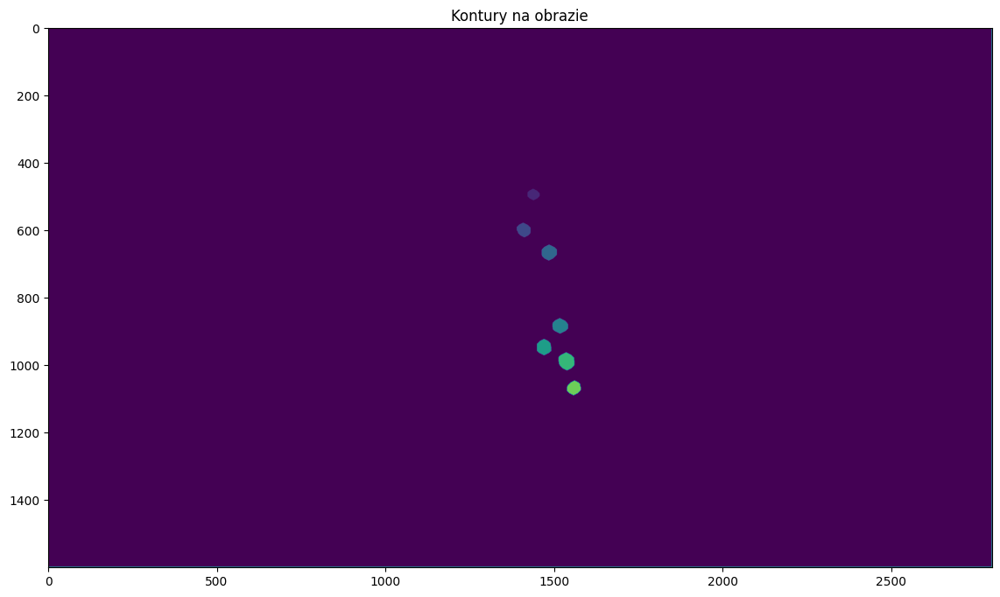

In [118]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

markers_binary = np.uint8(markers == -1) * 255 

contours, hierarchy = cv2.findContours(markers_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

calib_contours = calib.copy()
markers[markers == -1] = 10

calib_contours[markers==10] = [255,0,0]

plt.figure(figsize=(15, 8))
plt.imshow(markers)  
plt.title('Kontury na obrazie')
plt.show()


# ESPU

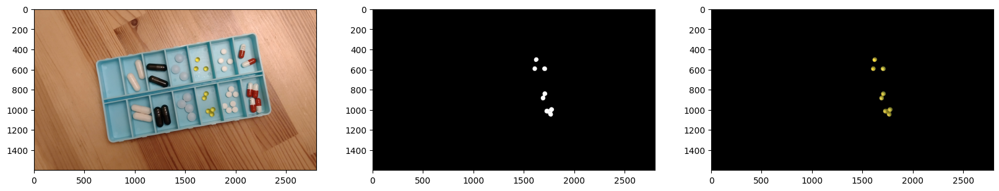

In [119]:
lower_yellow = np.array([20, 100, 100])   
upper_yellow = np.array([40, 255, 255])  

mask_yellow = cv2.inRange(hsv_calib, lower_yellow, upper_yellow)

plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.imshow(calib)

plt.subplot(1, 3, 2)
plt.imshow(mask_yellow, cmap='gray')

masked_image = cv2.bitwise_and(calib, calib, mask=mask_yellow)
plt.subplot(1, 3, 3)
plt.imshow(masked_image)

plt.show()


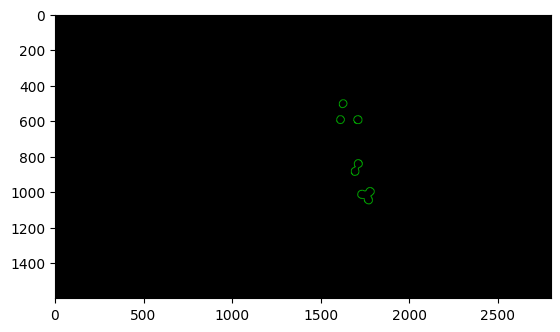

In [120]:
contours = cv2.findContours(mask_yellow, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
new = np.zeros_like(calib)
plt.imshow(cv2.drawContours(new, contours, -1, (0, 255, 0), 2))

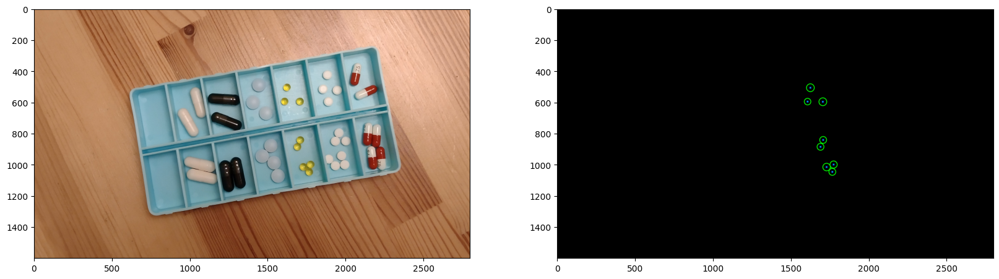

8


In [121]:
new = np.zeros_like(calib)
circles = cv2.HoughCircles(
    mask_yellow, 
    cv2.HOUGH_GRADIENT, dp=1.2, minDist=20, param1=200, param2=12, minRadius=5, maxRadius=30)

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles:
        cv2.circle(new, (x, y), r, (0, 255, 0), 4)  
        cv2.rectangle(new, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1) 

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(calib)

plt.subplot(1, 2, 2)
plt.imshow(new)

plt.show()
print(len(circles))

# BIOX

(array([2.684000e+03, 7.500000e+02, 2.152000e+03, 7.162000e+03,
        9.399000e+03, 4.476000e+03, 2.873000e+03, 2.296000e+03,
        1.206700e+04, 7.906600e+04, 2.221310e+05, 6.666520e+05,
        7.573550e+05, 1.127091e+06, 3.376220e+05, 1.532200e+04,
        8.557000e+03, 3.869000e+03, 2.429000e+03, 2.837000e+03,
        3.457000e+03, 4.196000e+03, 1.591000e+03, 1.962000e+03,
        1.415000e+03, 2.884000e+03, 4.149000e+03, 2.777000e+03,
        2.708000e+03, 1.570000e+03, 5.177000e+03, 5.640000e+02,
        3.780000e+02, 1.860000e+02, 1.346000e+03, 2.386000e+03,
        1.731000e+03, 4.400000e+01, 1.960000e+02, 1.650000e+02,
        5.720000e+02, 7.900000e+01, 1.792000e+03, 1.533000e+03,
        6.100000e+01, 9.800000e+01, 9.000000e+01, 4.500000e+01,
        2.170000e+02, 2.800000e+01, 1.587000e+03, 8.090000e+02,
        7.400000e+01, 7.500000e+01, 6.600000e+01, 1.829000e+03,
        3.070000e+02, 5.600000e+01, 7.200000e+01, 4.300000e+01,
        1.396000e+03, 3.100000e+01, 5.90

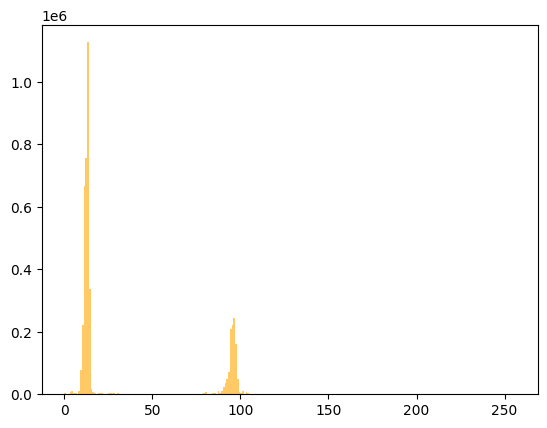

In [122]:
plt.hist(h.ravel(), bins=256, range=(0, 256), color='orange', alpha=0.6, label='S')

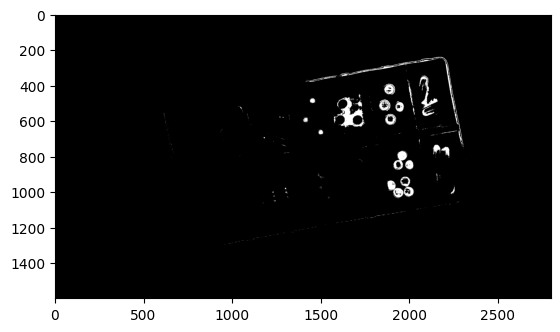

In [123]:

lower_hue = 0    
upper_hue = 180  
lower_s = 10     
upper_s = 30     
lower_v = 190    
upper_v = 255    


lower_bound = np.array([lower_hue, lower_s, lower_v])  
upper_bound = np.array([upper_hue, upper_s, upper_v]) 

mask = cv2.inRange(hsv_calib, lower_bound, upper_bound)

open = cv2.morphologyEx(mask, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 5)), iterations=4)
close = cv2.morphologyEx(open, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)), iterations=1)

plt.imshow(mask, cmap='gray')
plt.show()


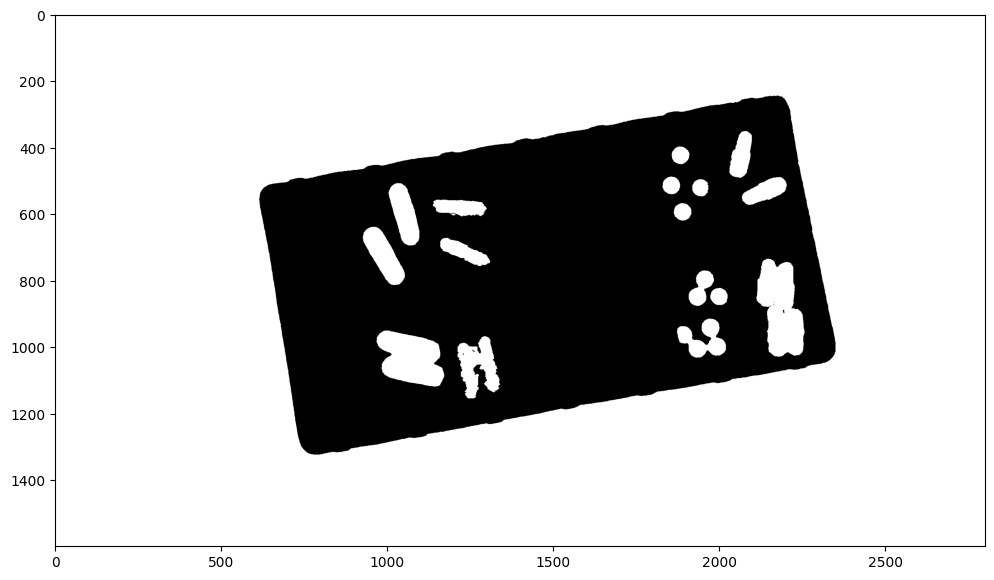

In [124]:
hsv_calib = cv2.cvtColor(calib, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv_calib)
h_threshold = cv2.threshold(h, 30, 255, cv2.THRESH_BINARY_INV)[1]
h_threshold[mask_yellow == 255] = 0
open = cv2.morphologyEx(h_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=2)
contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
max_area = 10000  
filtered_mask = np.zeros_like(calib)  

all_except_yellow_and_blue = open.copy()

plt.figure(figsize=(12, 8))
plt.imshow(open, cmap='gray')

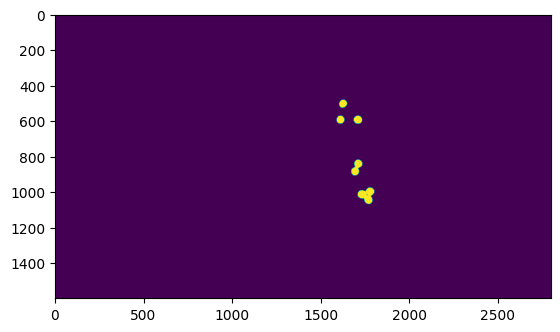

In [125]:
plt.imshow(mask_yellow)

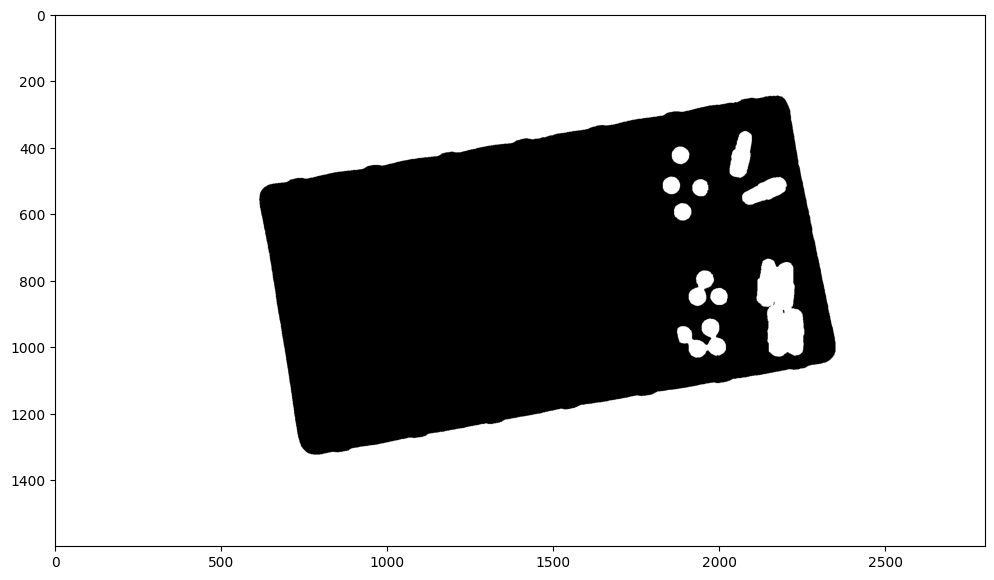

In [126]:
open_with_yellow = cv2.bitwise_and(open, cv2.bitwise_not(mask_yellow))  

open_with_yellow_and_carbon = cv2.bitwise_and(open_with_yellow, cv2.bitwise_not(carbon_mask))
open_with_yellow_carbon_and_probio = cv2.bitwise_and(open_with_yellow_and_carbon, cv2.bitwise_not(probio_mask))
open = cv2.morphologyEx(open_with_yellow_carbon_and_probio, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)), iterations=3)

plt.figure(figsize=(12, 10))
plt.imshow(open, cmap='gray')
plt.show()

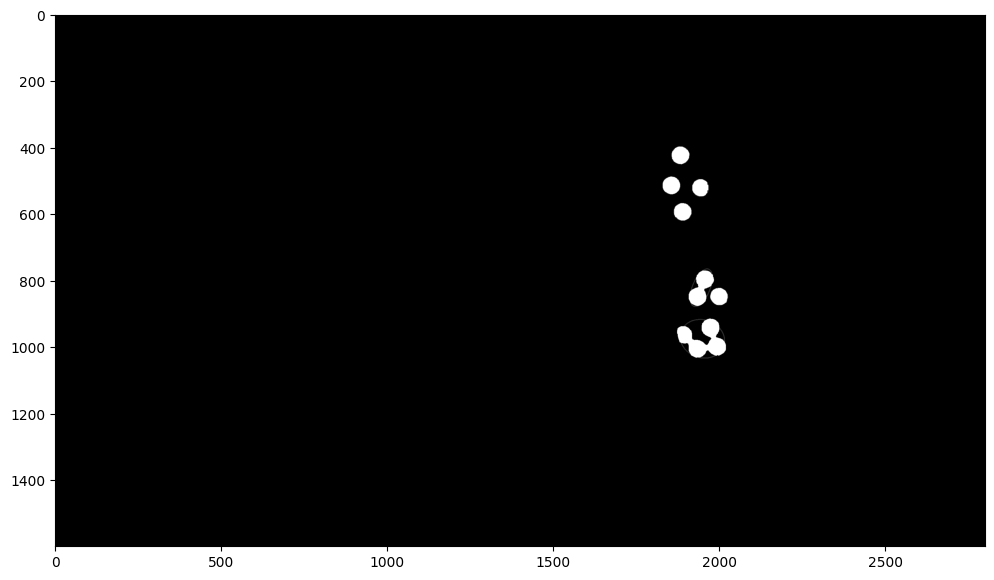

In [127]:
open_with_yellow = cv2.bitwise_and(open, cv2.bitwise_not(mask_yellow))  # Nałożenie białych elementów z yellow_mask na 'open'
open_with_yellow_and_carbon = cv2.bitwise_and(open_with_yellow, cv2.bitwise_not(carbon_mask))
open_with_yellow_carbon_and_probio = cv2.bitwise_and(open_with_yellow_and_carbon, cv2.bitwise_not(probio_mask))

open = cv2.morphologyEx(open_with_yellow_carbon_and_probio, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)), iterations=3)

contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

final_mask = np.zeros_like(open)  
output_image = np.zeros_like(open)  
for contour in contours:
    if len(contour) >= 5: 
        ellipse = cv2.fitEllipse(contour)  
        center, axes, angle = ellipse
        if axes[0] > 10 and axes[1] < 150:
            cv2.ellipse(output_image, ellipse, (50, 0, 0), 2)  
            for y in range(0, open.shape[0]):
                for x in range(0, open.shape[1]):
                    if cv2.pointPolygonTest(contour, (x, y), False) >= 0:  
                        if open[y, x] == 255:
                            output_image[y, x] = 255  
                        else:
                            output_image[y, x] = 0  


biox_mask = output_image.copy()
plt.figure(figsize=(12, 10))
plt.imshow(output_image, cmap='gray')
plt.show()


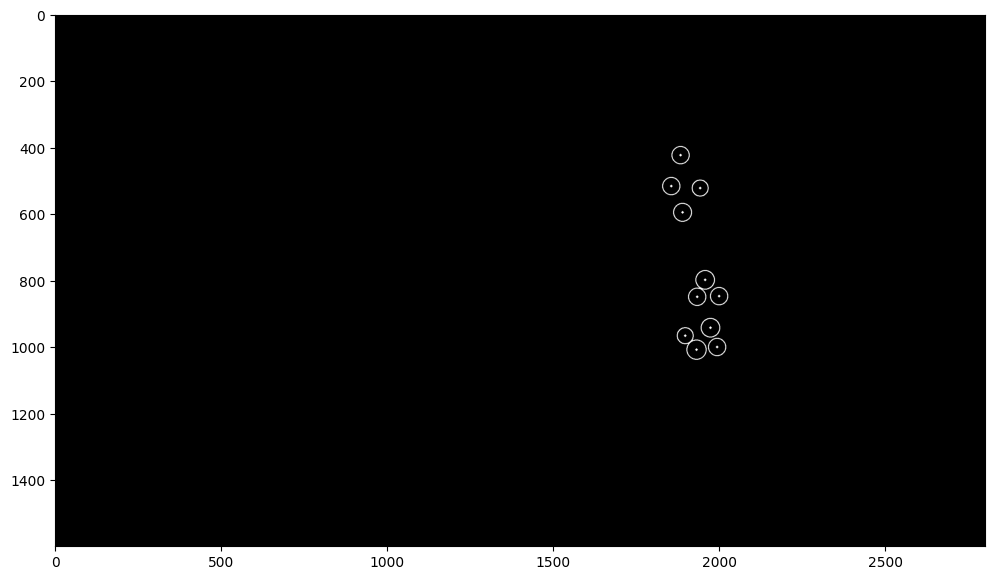

In [128]:
new = np.zeros_like(output_image)
output_gray = output_image if len(output_image.shape) == 2 else cv2.cvtColor(output_image, cv2.COLOR_BGR2GRAY)

min_radius = 20  
max_radius = 35  

circles = cv2.HoughCircles(output_gray, cv2.HOUGH_GRADIENT, dp=1.2, minDist=25,
                           param1=50, param2=17, minRadius=min_radius, maxRadius=max_radius)

output_circles = output_image.copy()
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x, y, r) in circles:
        cv2.circle(new, (x, y), r, (255, 0, 0), 2)  
        cv2.circle(new, (x, y), 2, (255, 0, 0), 3) 

plt.figure(figsize=(12, 10))
plt.imshow(new, cmap='gray')
plt.show()


(935.6839599609375, 2015.9248046875)
(119.56647491455078, 180.9655303955078)
(3.692478895187378, 7.4808173179626465)
(4.042202472686768, 11.832513809204102)
(155.4542694091797, 212.8301239013672)
(114.1468734741211, 134.4749755859375)
(50.13248825073242, 52.51301574707031)
(52.56184768676758, 121.16059112548828)
(121.5507583618164, 323.1340637207031)
(5.693601131439209, 11.149503707885742)
(3.1622776985168457, 3.1622776985168457)
(3.1622776985168457, 3.1622776985168457)
(44.37803268432617, 185.64205932617188)
(68.19913482666016, 214.71975708007812)
(4.848021507263184, 11.58410930633545)
(51.034507751464844, 52.28593444824219)
(46.6694221496582, 174.80104064941406)
(64.23664855957031, 216.5522003173828)
(48.67161560058594, 51.368988037109375)
(55.517555236816406, 153.58897399902344)
(51.871578216552734, 52.26128387451172)
(51.747310638427734, 52.36808776855469)
(56.238670349121094, 151.60983276367188)


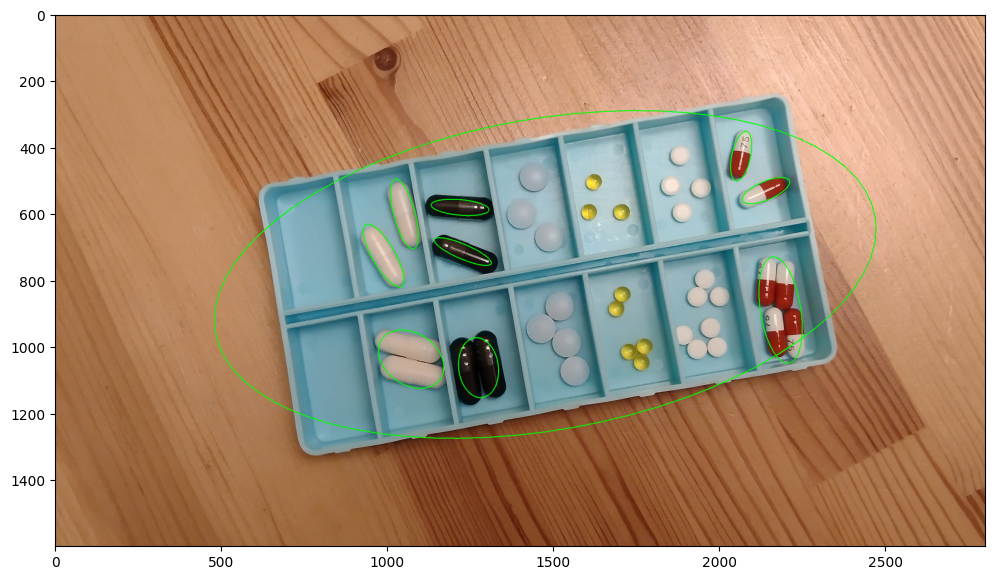

In [129]:
h_threshold = cv2.threshold(h, 30, 255, cv2.THRESH_BINARY_INV)[1]
h_threshold[mask_yellow == 255] = 0  
open = cv2.morphologyEx(h_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=2)

contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

output_image = calib.copy()

for contour in contours:
    if len(contour) >= 5:  
        ellipse = cv2.fitEllipse(contour)
        center, axes, angle = ellipse
        print(axes)
        if axes[0] > 10 and axes[1] > 150:
            cv2.ellipse(output_image, ellipse, (0, 255, 0), 2) 

plt.figure(figsize=(12, 8))
plt.imshow(output_image)  
plt.show()


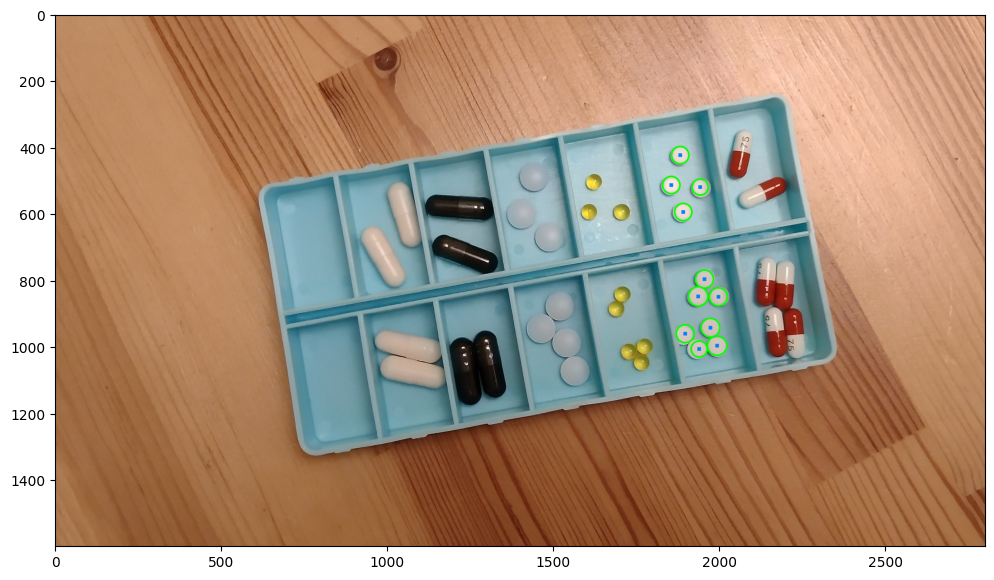

In [130]:
hsv_calib = cv2.cvtColor(calib, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv_calib)

h_threshold = cv2.threshold(h, 30, 255, cv2.THRESH_BINARY_INV)[1]
h_threshold[mask_yellow == 255] = 0 

open = cv2.morphologyEx(h_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=2)

contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

output_image = calib.copy()

ellipse_mask = np.zeros_like(h_threshold)

for contour in contours:
    if len(contour) >= 5:  
        ellipse = cv2.fitEllipse(contour)
        center, axes, angle = ellipse

        if axes[0] > 10 and axes[1] > 150 and axes[0] < 300 and axes[1] < 1000:
            cv2.ellipse(output_image, ellipse, (0, 255, 0), 2) 

            cv2.ellipse(ellipse_mask, ellipse, 255, thickness=cv2.FILLED)

circles = cv2.HoughCircles(
    open, 
    cv2.HOUGH_GRADIENT, dp=1.2, minDist=10, param1=200, param2=17, minRadius=20, maxRadius=30
)

new_image = calib.copy()

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x, y, r) in circles:
        if np.any(ellipse_mask[y - r:y + r, x - r:x + r] == 255):
            continue 

        cv2.circle(new_image, (x, y), r, (0, 255, 0), 4) 
        cv2.rectangle(new_image, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)  

plt.figure(figsize=(12, 8))
plt.imshow(new_image) 
plt.show()


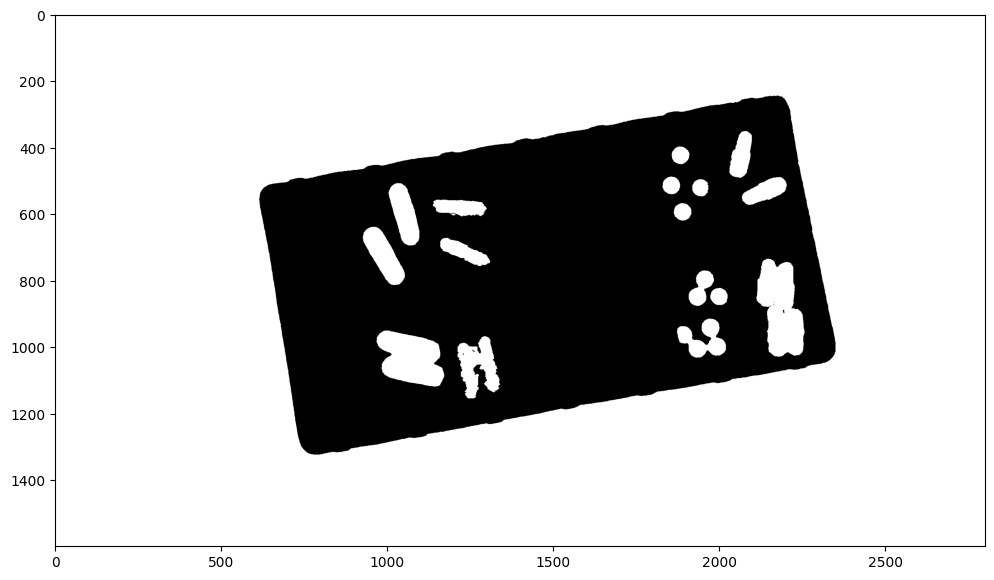

In [155]:
hsv_calib = cv2.cvtColor(calib, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv_calib)

h_threshold = cv2.threshold(h, 30, 255, cv2.THRESH_BINARY_INV)[1]
h_threshold[mask_yellow == 255] = 0  

open = cv2.morphologyEx(h_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=2)

contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

output_image = calib.copy()

ellipse_mask = np.zeros_like(h_threshold)

for contour in contours:
    if len(contour) >= 5:  
        ellipse = cv2.fitEllipse(contour)
        center, axes, angle = ellipse

        if axes[0] > 10 and axes[1] > 150 and axes[0] < 300 and axes[1] < 1000:

            cv2.ellipse(output_image, ellipse, (0, 255, 0), 2) 

            cv2.ellipse(ellipse_mask, ellipse, 255, thickness=cv2.FILLED)

circles = cv2.HoughCircles(
    open, 
    cv2.HOUGH_GRADIENT, dp=1.2, minDist=10, param1=200, param2=17, minRadius=20, maxRadius=30
)

new_image = calib.copy()

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x, y, r) in circles:
        if np.any(ellipse_mask[y - r:y + r, x - r:x + r] == 255):
            continue  

        cv2.circle(new_image, (x, y), r, (0, 255, 0), 4) 
        cv2.rectangle(new_image, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1) 

plt.figure(figsize=(12, 8))
plt.imshow(open, cmap='gray') 
plt.show()
great_mask = open.copy()


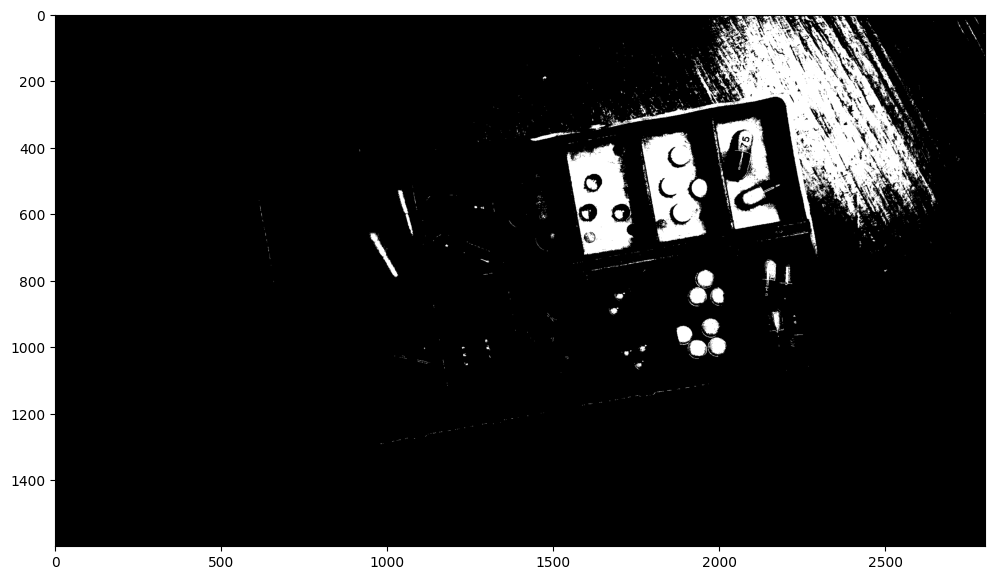

In [132]:
image = calib

lab_image = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
l, a, b = cv2.split(lab_image)

lower_white = np.array([100, 0, 0])
upper_white = np.array([255, 100, 100])

mask = cv2.inRange(l, 200, 255)
result = cv2.bitwise_and(image, image, mask=mask)


plt.figure(figsize=(12, 10))
plt.imshow(mask, cmap='gray')

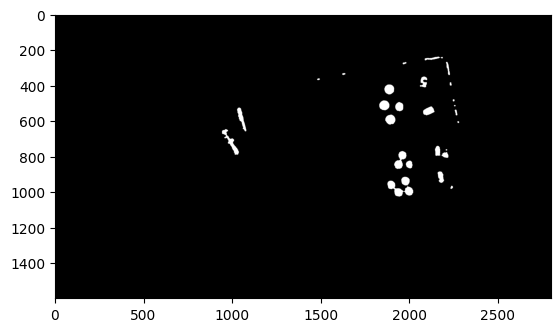

In [133]:
h_lower, h_upper = 0, 80   

s_lower, s_upper = 0, 50

v_lower, v_upper = 200, 255

h_mask = cv2.inRange(h, h_lower, h_upper)
s_mask = cv2.inRange(s, s_lower, s_upper)
v_mask = cv2.inRange(v, v_lower, v_upper)

combined_mask = cv2.bitwise_and(h_mask, s_mask)
combined_mask = cv2.bitwise_and(combined_mask, v_mask)

open_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
opened = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, open_kernel, iterations=2)

close_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, close_kernel, iterations=2)

plt.imshow(closed, cmap='gray')
plt.show()


Powierzchnia konturu: 12389.0
Powierzchnia konturu: 1798.5
Powierzchnia konturu: 1676.5
Powierzchnia konturu: 1713.5
Powierzchnia konturu: 1437.5
Powierzchnia konturu: 1320.0
Powierzchnia konturu: 1866.5
Powierzchnia konturu: 1915.5
Powierzchnia konturu: 532.0
Powierzchnia konturu: 2509.0
Powierzchnia konturu: 1375.0
Powierzchnia konturu: 1906.5
Powierzchnia konturu: 2647.5
Powierzchnia konturu: 2441.5
Powierzchnia konturu: 437.0


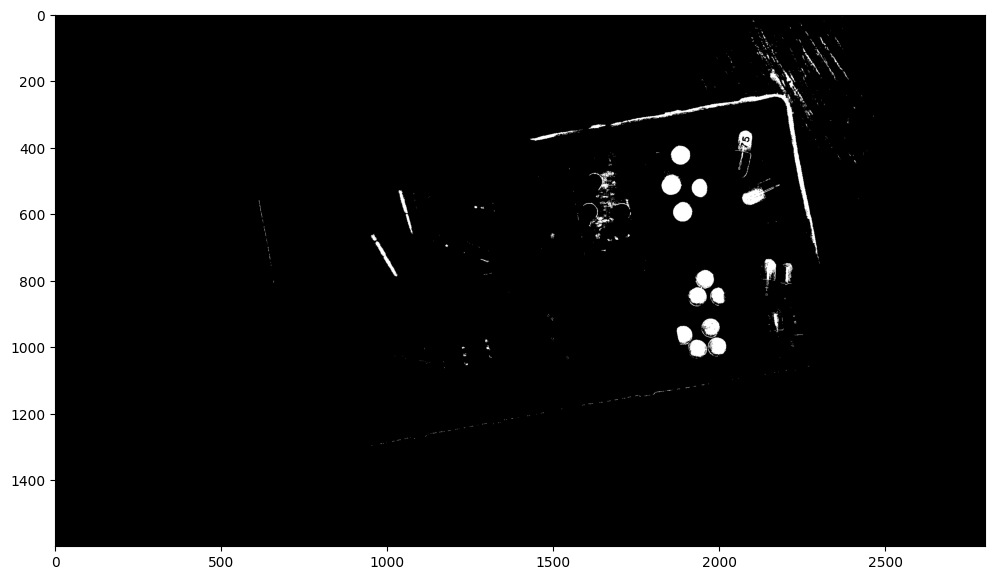

In [134]:
h, s, v = cv2.split(calib)

h_lower, h_upper = 190, 255
s_lower, s_upper = 180, 255
v_lower, v_upper = 180, 250 

h_mask = cv2.inRange(h, h_lower, h_upper)
s_mask = cv2.inRange(s, s_lower, s_upper)
v_mask = cv2.inRange(v, v_lower, v_upper)


combined_mask = cv2.bitwise_and(h_mask, s_mask)
combined_mask = cv2.bitwise_and(combined_mask, v_mask)

open_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3))
opened = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, open_kernel, iterations=6)

contours, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
min_area = 800 
filtered_mask = np.zeros_like(closed) 

for contour in contours:
    print(f"Powierzchnia konturu: {area}")
    area = cv2.contourArea(contour)  
    if area > min_area and area < 2600:  
        cv2.drawContours(filtered_mask, [contour], -1, 255, thickness=cv2.FILLED)


close_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3))
closed = cv2.morphologyEx(filtered_mask, cv2.MORPH_CLOSE, close_kernel, iterations=1)

plt.figure(figsize=(12, 10))
plt.imshow(combined_mask, cmap='gray')
plt.show()


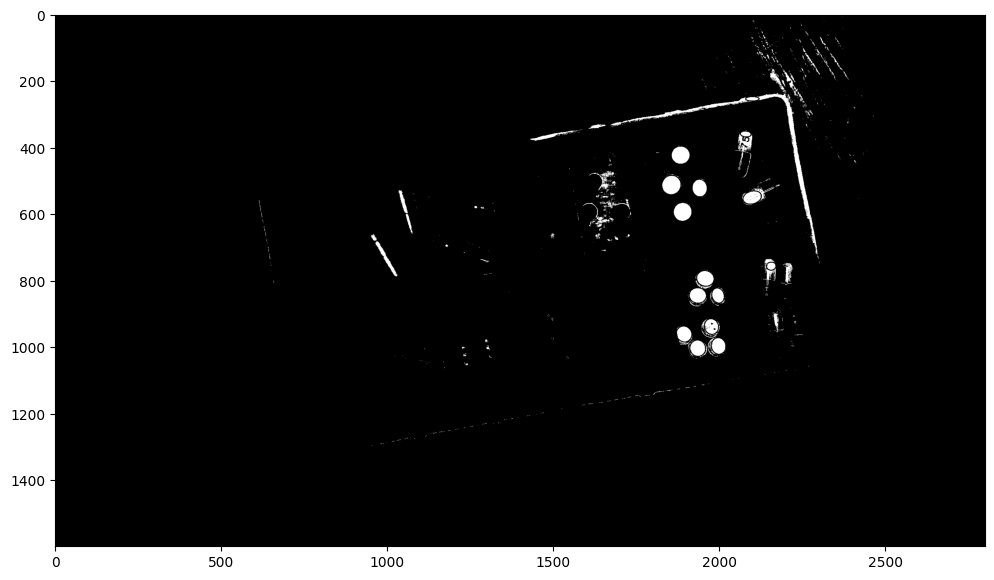

In [135]:
h, s, v = cv2.split(calib)

h_lower, h_upper = 190, 255
s_lower, s_upper = 180, 255
v_lower, v_upper = 180, 250

h_mask = cv2.inRange(h, h_lower, h_upper)
s_mask = cv2.inRange(s, s_lower, s_upper)
v_mask = cv2.inRange(v, v_lower, v_upper)

combined_mask = cv2.bitwise_and(h_mask, s_mask)
combined_mask = cv2.bitwise_and(combined_mask, v_mask)

open_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3))
opened = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, open_kernel, iterations=6)

contours, _ = cv2.findContours(opened, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

final_mask = combined_mask.copy()

for contour in contours:
    if len(contour) >= 5:  
        ellipse = cv2.fitEllipse(contour)
        center, axes, angle = ellipse
        
        min_axis = 0
        max_axis = 1000
        
        if min_axis < axes[0] < max_axis and min_axis < axes[1] < max_axis:
            cv2.ellipse(final_mask, ellipse, (0, 255, 0), 2) 

plt.figure(figsize=(12, 10))
plt.imshow(final_mask, cmap='gray')
plt.show()


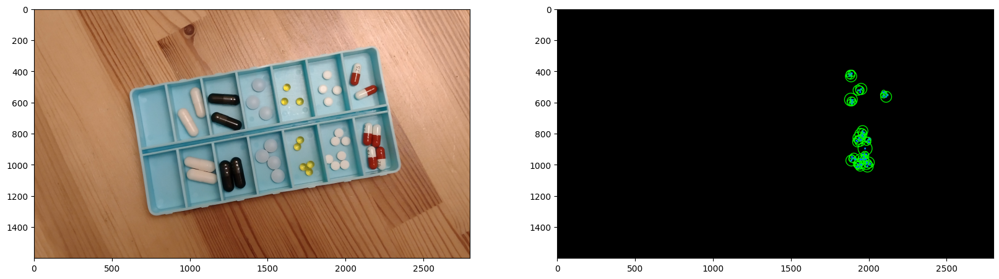

66


In [136]:
new = np.zeros_like(calib)
circles = cv2.HoughCircles(
    closed, 
    cv2.HOUGH_GRADIENT, dp=1.2, minDist=10, param1=200, param2=10, minRadius=5, maxRadius=50)

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles:
        cv2.circle(new, (x, y), r, (0, 255, 0), 4)  
        cv2.rectangle(new, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)  

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(calib)

plt.subplot(1, 2, 2)
plt.imshow(new)

plt.show()
print(len(circles))

# KETO

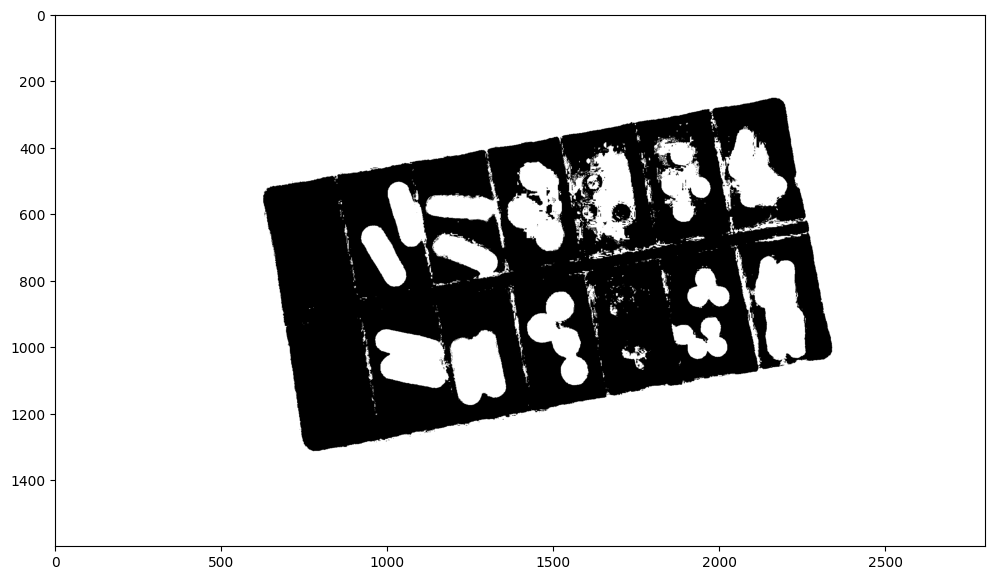

In [137]:
lab_hsv = cv2.cvtColor(calib, cv2.COLOR_RGB2LAB)
l, a , b = cv2.split(lab_hsv)
T, thresh = cv2.threshold(a, 120, 255, cv2.THRESH_BINARY) 
thresh2 = thresh.copy() 
plt.figure(figsize=(12, 10))
plt.imshow(thresh, cmap='gray')

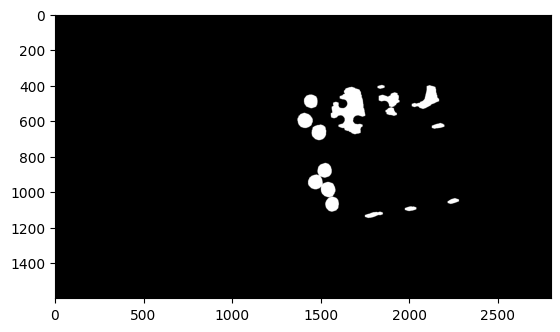

In [138]:
hsv_calib = cv2.cvtColor(calib, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv_calib)
s_threshold = cv2.threshold(s, 40, 100, cv2.THRESH_BINARY_INV)[1]
s_threshold[all_except_yellow_and_blue == 255] = 0
open = cv2.morphologyEx(s_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 5)), iterations=5)
plt.imshow(open, cmap='gray')

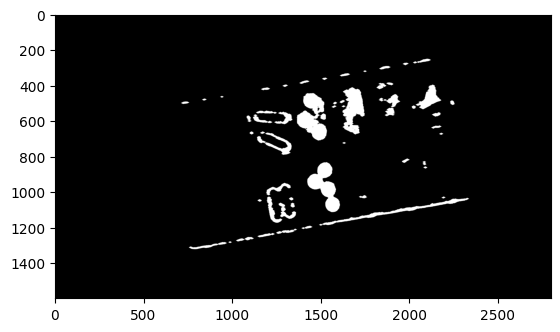

In [139]:
thresh[all_except_yellow_and_blue == 255] = 0 
open = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=5)
plt.imshow(open, cmap='gray')

In [140]:
thresh2 = s_threshold.copy()
thresh2 = cv2.bitwise_and(thresh2, cv2.bitwise_not(carbon_mask))
thresh2 = cv2.bitwise_and(thresh2, cv2.bitwise_not(probio_mask))
thresh2 = cv2.bitwise_and(thresh2, cv2.bitwise_not(mask_yellow))
thresh2 = cv2.bitwise_and(thresh2, cv2.bitwise_not(biox_mask))

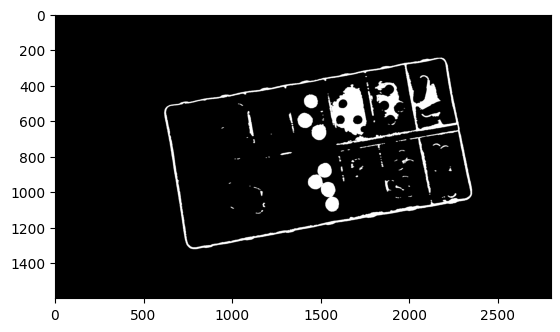

In [141]:
open = cv2.morphologyEx(thresh2, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=2)
plt.imshow(open, cmap='gray')

10

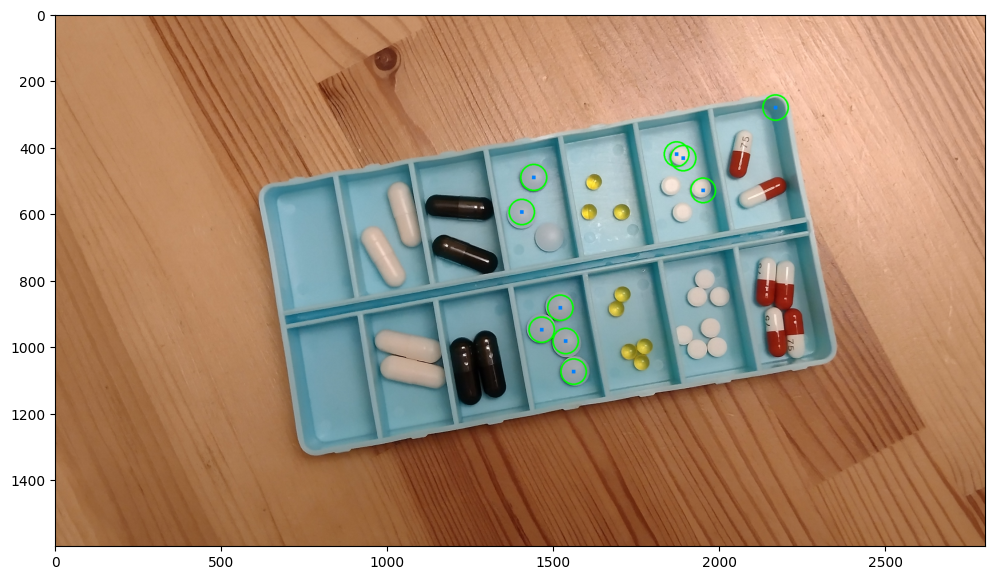

In [142]:
circles = cv2.HoughCircles(
    open, 
    cv2.HOUGH_GRADIENT, dp=1.2, minDist=20, param1=200, param2=10, minRadius=35, maxRadius=40
)


new = calib.copy()

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles:
        cv2.circle(new, (x, y), r, (0, 255, 0), 4)
        cv2.rectangle(new, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)  

plt.figure(figsize=(12, 10))
plt.imshow(new, cmap='gray')
len(circles)

In [143]:
hsv_calib = cv2.cvtColor(calib, cv2.COLOR_RGB2HSV)
lower_yellow = np.array([20, 100, 100])   
upper_yellow = np.array([40, 255, 255])  

mask_yellow = cv2.inRange(hsv_calib, lower_yellow, upper_yellow)

h, s, v = cv2.split(hsv_calib)
binary_calib = cv2.threshold(v, 50, 255, cv2.THRESH_BINARY_INV)[1]

ellipse_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
ellipse_kernel2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))

open_mask = cv2.morphologyEx(binary_calib, cv2.MORPH_OPEN, ellipse_kernel)
closed_mask = cv2.morphologyEx(open_mask, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (30, 30)))
carbon_mask = closed_mask.copy()

h, s, v = cv2.split(hsv_calib)
h_threshold = cv2.threshold(h, 30, 255, cv2.THRESH_BINARY_INV)[1]
h_threshold[mask_yellow == 255] = 0
open = cv2.morphologyEx(h_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=2)
contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE) 

all_except_yellow_and_blue = open.copy()

h, s, v = cv2.split(hsv_calib)
h_threshold = cv2.threshold(h, 30, 255, cv2.THRESH_BINARY_INV)[1]
h_threshold[mask_yellow == 255] = 0
open = cv2.morphologyEx(h_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=2)
all_except_yellow_and_blue = open.copy()
open_with_yellow = cv2.bitwise_and(open, cv2.bitwise_not(mask_yellow)) 
open_with_yellow_and_carbon = cv2.bitwise_and(open_with_yellow, cv2.bitwise_not(carbon_mask))
open_with_yellow_carbon_and_= cv2.bitwise_and(open_with_yellow_and_carbon, cv2.bitwise_not(probio_mask))
open = cv2.morphologyEx(open_with_yellow_carbon_and_probio, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)), iterations=3)
contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

final_mask = np.zeros_like(open)  
output_image = np.zeros_like(open)  
for contour in contours:
    if len(contour) >= 5: 
        ellipse = cv2.fitEllipse(contour) 
        center, axes, angle = ellipse
        if axes[0] > 10 and axes[1] < 150:
            cv2.ellipse(output_image, ellipse, (50, 0, 0), 2) 
            for y in range(0, open.shape[0]):
                for x in range(0, open.shape[1]):
                    if cv2.pointPolygonTest(contour, (x, y), False) >= 0:  
                        if open[y, x] == 255:
                            output_image[y, x] = 255 
                        else:
                            output_image[y, x] = 0  
biox_mask = output_image.copy()

In [ ]:
lab_hsv = cv2.cvtColor(calib, cv2.COLOR_RGB2LAB)
l, a , b = cv2.split(lab_hsv)
T, thresh = cv2.threshold(a, 121, 255, cv2.THRESH_BINARY) 
thresh[all_except_yellow_and_blue == 255] = 0
thresh[carbon_mask == 255] = 0
thresh[mask_yellow == 255] = 0
thresh[biox_mask == 255] = 0
thresh2 = thresh.copy() 
open = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 5)), iterations=3)

contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
final_mask = np.zeros_like(thresh)
for contour in contours:
    area = cv2.contourArea(contour)  
    if area > 3500: 
        cv2.drawContours(final_mask, [contour], -1, 255, thickness=cv2.FILLED)

circles = cv2.HoughCircles(
            final_mask, 
            cv2.HOUGH_GRADIENT, dp=1.2, minDist=30, param1=200, param2=8, minRadius=33, maxRadius=41)
circles = np.round(circles[0, :]).astype("int")
new = calib.copy()
for (x, y, r) in circles:
    cv2.circle(new, (x, y), r, (0, 255, 0), 4)
    cv2.rectangle(new, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)

plt.figure(figsize=(12, 10))
plt.imshow(final_mask, cmap='gray')

NameError: name 'all_except_yellow_and_blue' is not defined

In [146]:
hsv_calib = cv2.cvtColor(calib, cv2.COLOR_RGB2HSV)
lower_yellow = np.array([20, 100, 100])   
upper_yellow = np.array([40, 255, 255])  

mask_yellow = cv2.inRange(hsv_calib, lower_yellow, upper_yellow)

h, s, v = cv2.split(hsv_calib)
binary_calib = cv2.threshold(v, 50, 255, cv2.THRESH_BINARY_INV)[1]

ellipse_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
ellipse_kernel2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))

open_mask = cv2.morphologyEx(binary_calib, cv2.MORPH_OPEN, ellipse_kernel)
closed_mask = cv2.morphologyEx(open_mask, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (30, 30)))
carbon_mask = closed_mask.copy()

h, s, v = cv2.split(hsv_calib)
h_threshold = cv2.threshold(h, 30, 255, cv2.THRESH_BINARY_INV)[1]
h_threshold[mask_yellow == 255] = 0
open = cv2.morphologyEx(h_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=2)
contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE) 

all_except_yellow_and_blue = open.copy()

h, s, v = cv2.split(hsv_calib)
h_threshold = cv2.threshold(h, 30, 255, cv2.THRESH_BINARY_INV)[1]
h_threshold[mask_yellow == 255] = 0
open = cv2.morphologyEx(h_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=2)
all_except_yellow_and_blue = open.copy()
open_with_yellow = cv2.bitwise_and(open, cv2.bitwise_not(mask_yellow)) 
open_with_yellow_and_carbon = cv2.bitwise_and(open_with_yellow, cv2.bitwise_not(carbon_mask))
open_with_yellow_carbon_and_probio = cv2.bitwise_and(open_with_yellow_and_carbon, cv2.bitwise_not(probio_mask))
open = cv2.morphologyEx(open_with_yellow_carbon_and_probio, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)), iterations=3)
contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

final_mask = np.zeros_like(open)  
output_image = np.zeros_like(open)  
for contour in contours:
    if len(contour) >= 5: 
        ellipse = cv2.fitEllipse(contour) 
        center, axes, angle = ellipse
        if axes[0] > 10 and axes[1] < 150:
            cv2.ellipse(output_image, ellipse, (50, 0, 0), 2) 
            for y in range(0, open.shape[0]):
                for x in range(0, open.shape[1]):
                    if cv2.pointPolygonTest(contour, (x, y), False) >= 0:  
                        if open[y, x] == 255:
                            output_image[y, x] = 255 
                        else:
                            output_image[y, x] = 0  
biox_mask = output_image.copy()

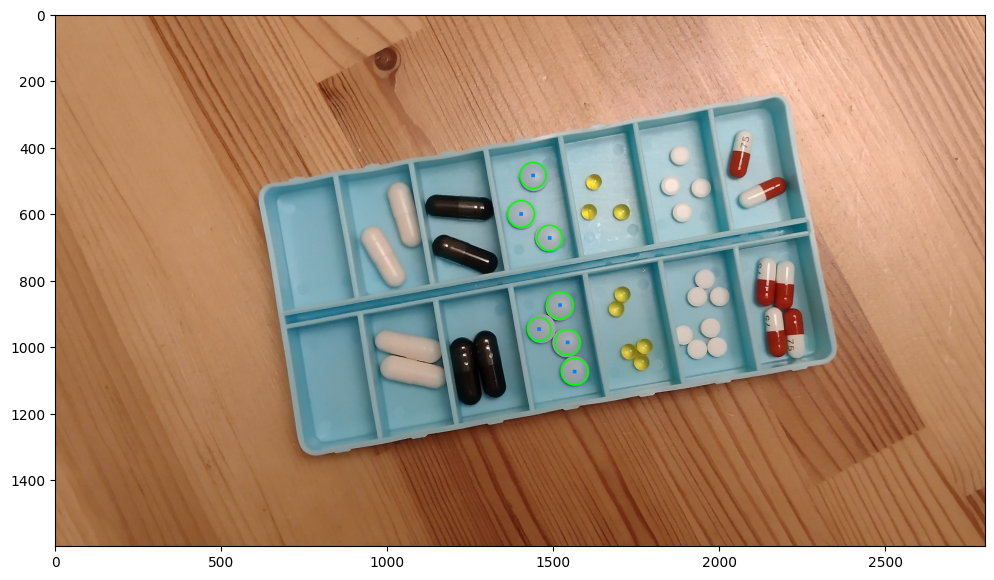

In [147]:
lab_hsv = cv2.cvtColor(calib, cv2.COLOR_RGB2LAB)
l, a , b = cv2.split(lab_hsv)
T, thresh = cv2.threshold(a, 121, 255, cv2.THRESH_BINARY) 
thresh[all_except_yellow_and_blue == 255] = 0
thresh[carbon_mask == 255] = 0
thresh[mask_yellow == 255] = 0
thresh[biox_mask == 255] = 0
thresh2 = thresh.copy() 
open = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 5)), iterations=3)

contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
final_mask = np.zeros_like(thresh)
for contour in contours:
    area = cv2.contourArea(contour)  
    if area > 3500: 
        cv2.drawContours(final_mask, [contour], -1, 255, thickness=cv2.FILLED)

circles = cv2.HoughCircles(
final_mask, 
cv2.HOUGH_GRADIENT, dp=1.2, minDist=30, param1=200, param2=8, minRadius=33, maxRadius=41)
circles = np.round(circles[0, :]).astype("int")
new = calib.copy()
for (x, y, r) in circles:
    cv2.circle(new, (x, y), r, (0, 255, 0), 4)
    cv2.rectangle(new, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)

plt.figure(figsize=(12, 10))
plt.imshow(new, cmap='gray')

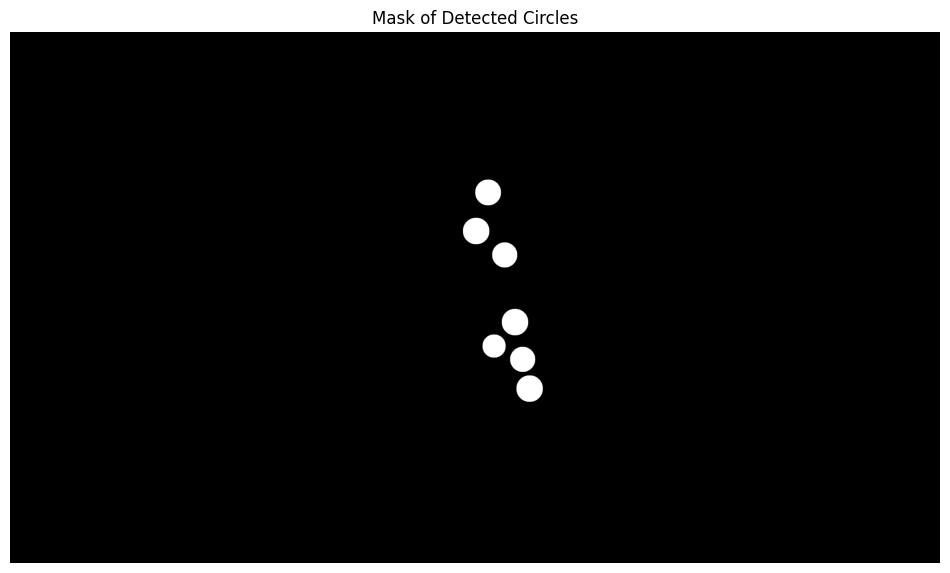

In [154]:
# Initialize a black mask with the same dimensions as the input image
circle_mask = np.zeros_like(final_mask)

# Draw the detected circles onto the mask
for (x, y, r) in circles:
    cv2.circle(circle_mask, (x, y), r, 255, -1)  # Fill the circle with white

keto_mask = circle_mask.copy()

# Visualize the mask
plt.figure(figsize=(12, 10))
plt.imshow(circle_mask, cmap='gray')
plt.title("Mask of Detected Circles")
plt.axis('off')
plt.show()


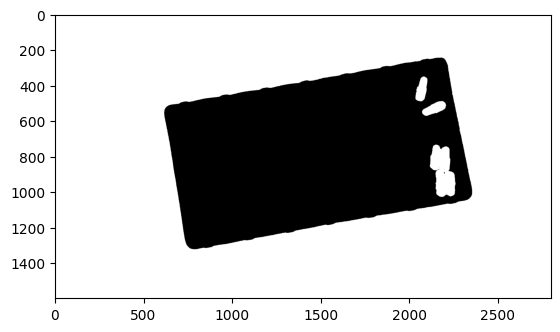

In [ ]:
great_mask = cv2.bitwise_and(open, cv2.bitwise_not(keto_mask))
great_mask = cv2.bitwise_and(great_mask, cv2.bitwise_not(biox_mask))
great_mask = cv2.bitwise_and(great_mask, cv2.bitwise_not(probio_mask))
great_mask = cv2.bitwise_and(great_mask, cv2.bitwise_not(carbon_mask))
open = cv2.morphologyEx(great_mask, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=4)
plt.imshow(open, cmap='gray')

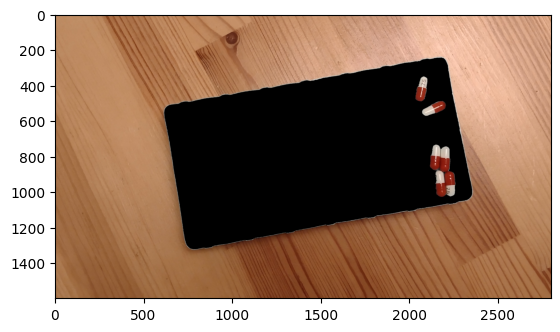

In [205]:
new_image = calib.copy()
new_image[open==0] = [0, 0, 0]
plt.imshow(new_image)

9


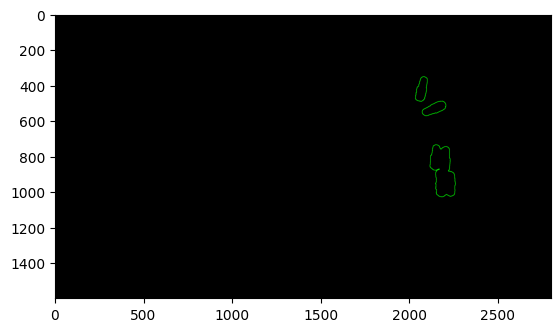

In [221]:
contours = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)[0]
print(len(contours))
plt.imshow(open, cmap='gray')
new = np.zeros_like(calib)
for contour in contours:
    area = cv2.contourArea(contour)
    if 100 < area < 100000:
        cv2.drawContours(new, [contour], -1, (0, 255, 0), 2)
plt.imshow(new)

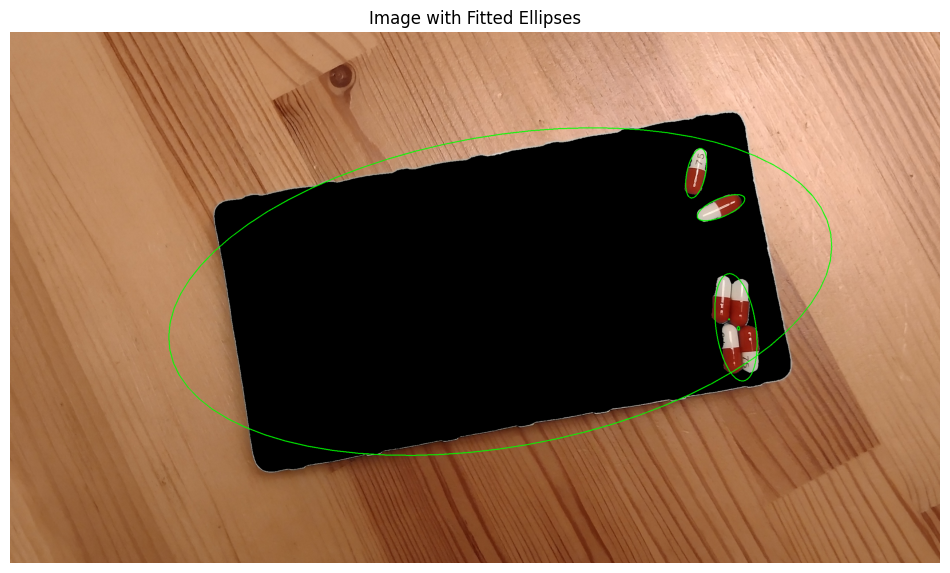

In [ ]:
ellipse_image = new_image.copy()

contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

for contour in contours:
    if len(contour) >= 5:  
        ellipse = cv2.fitEllipse(contour)
        cv2.ellipse(ellipse_image, ellipse, (0, 255, 0), 2) 

plt.figure(figsize=(12, 10))
plt.imshow(ellipse_image)
plt.axis('off')
plt.show()


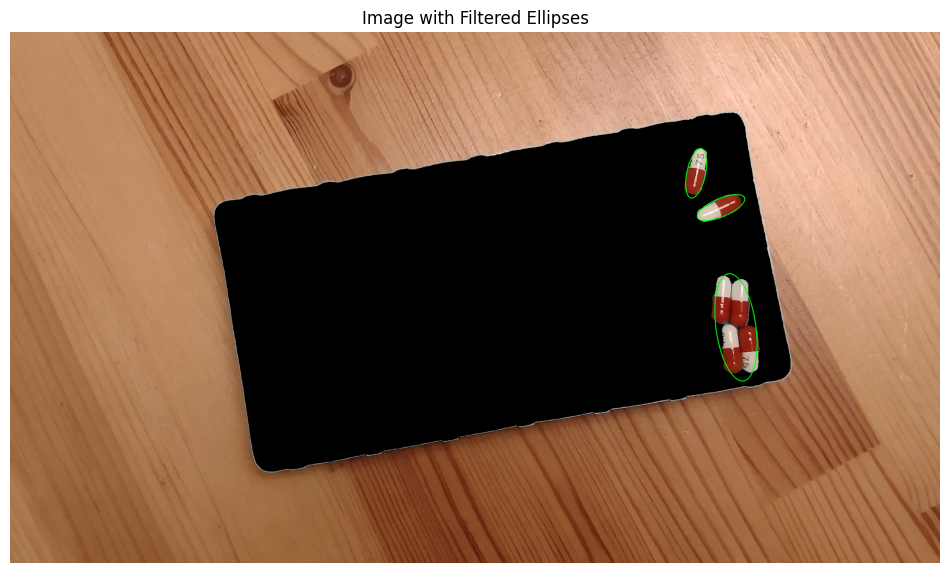

In [ ]:
filtered_ellipse_image = new_image.copy()

for contour in contours:
    if len(contour) >= 5: 
        ellipse = cv2.fitEllipse(contour)
        (center, axes, angle) = ellipse
        major_axis, minor_axis = axes  

        if 10 <= major_axis <= 500 and 10 <= minor_axis <= 500:
            cv2.ellipse(filtered_ellipse_image, ellipse, (0, 255, 0), 2) 

plt.figure(figsize=(12, 10))
plt.imshow(filtered_ellipse_image)
plt.title("Image with Filtered Ellipses")
plt.axis('off')
plt.show()


9


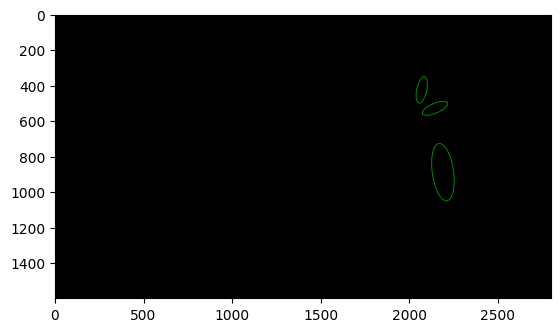

In [ ]:
hsv_calib = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv_calib)

h_threshold = cv2.threshold(h, 30, 255, cv2.THRESH_BINARY_INV)[1]
h_threshold[mask_yellow == 255] = 0  

open = cv2.morphologyEx(h_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=2)
great_mask = open.copy()
great_mask = cv2.bitwise_and(open, cv2.bitwise_not(keto_mask))
great_mask = cv2.bitwise_and(great_mask, cv2.bitwise_not(biox_mask))
great_mask = cv2.bitwise_and(great_mask, cv2.bitwise_not(probio_mask))
great_mask = cv2.bitwise_and(great_mask, cv2.bitwise_not(carbon_mask))
open = cv2.morphologyEx(great_mask, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=4)
new_image = image.copy()
new_image[open==0] = [0, 0, 0]
filtered_ellipse_image = np.zeros_like(new_image)

for contour in contours:
    if len(contour) >= 5: 
        ellipse = cv2.fitEllipse(contour)
        (center, axes, angle) = ellipse
        major_axis, minor_axis = axes  

        if 50 <= major_axis <= 500 and 100 <= minor_axis <= 500:
                cv2.ellipse(filtered_ellipse_image, ellipse, (0, 255, 0), 2) 

plt.imshow(filtered_ellipse_image)

___________________________________________________

In [148]:
import cv2
import numpy as np
from typing import List, Any
from matplotlib import pyplot as plt

class PillType:
    PROBIO = 1
    CARBON = 2
    KETO = 3
    ESPU = 4
    BIOX = 5
    LINE = 6

class Pill:
    """Output of object detection, represents a single instance"""
    def __init__(self, pill_type: PillType, location: Any):
        self.type = pill_type
        self.location = location

def detect_objects(image: np.ndarray, **kwargs) -> List[Pill]:
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)

    _, binary_calib = cv2.threshold(v, 50, 255, cv2.THRESH_BINARY_INV)

    ellipse_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    open_mask = cv2.morphologyEx(binary_calib, cv2.MORPH_OPEN, ellipse_kernel)
    closed_mask = cv2.morphologyEx(open_mask, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (30, 30)))

    contours, _ = cv2.findContours(closed_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    pills = []
    print(len(contours))

    for contour in contours:
        if cv2.contourArea(contour) > 500:  
            x, y, w, h = cv2.boundingRect(contour)
            location = (x, y, w, h)

            pill_type = PillType.CARBON  

            pill = Pill(pill_type, location)
            pills.append(pill)
    print(len(pills))

    return pills


In [ ]:
import cv2
import numpy as np
from typing import List, Any
from matplotlib import pyplot as plt

class PillType:
    PROBIO = 1
    CARBON = 2
    KETO = 3
    ESPU = 4
    BIOX = 5
    LINE = 6

class Pill:
    """Output of object detection, represents a single instance"""
    def __init__(self, pill_type: PillType, location: Any):
        self.type = pill_type
        self.location = location

def detect_objects(image: np.ndarray, **kwargs) -> List[Pill]:
    pills = []
    pills_types = kwargs.get('pilltype', None)

    def angle_of_line(x1, y1, x2, y2):
            return np.arctan2(y2 - y1, x2 - x1) * 180 / np.pi  

    def parallel_line_distance(line1, line2):
        x1, y1, x2, y2 = line1
        x3, y3, x4, y4 = line2
        
        angle1 = angle_of_line(x1, y1, x2, y2)
        angle2 = angle_of_line(x3, y3, x4, y4)
        
        if abs(angle1 - angle2) < min_angle_diff:
            a = y2 - y1
            b = x1 - x2
            c = x2 * y1 - x1 * y2
            
            distance = abs(a * x3 + b * y3 + c) / np.sqrt(a**2 + b**2)
            
            return distance
        else:
            return None


    if PillType.ESPU in pills_types:
        hsv_calib = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        lower_yellow = np.array([20, 100, 100])   
        upper_yellow = np.array([40, 255, 255])   

        mask_yellow = cv2.inRange(hsv_calib, lower_yellow, upper_yellow)
        new = np.zeros_like(image)
        circles = cv2.HoughCircles(
            mask_yellow, 
            cv2.HOUGH_GRADIENT, dp=1.2, minDist=20, param1=200, param2=12, minRadius=5, maxRadius=30)

        if circles is not None:
            circles = np.round(circles[0, :]).astype("int")

            for x, y, r in circles:
                w = h = 2 * r  
                
                pill_type = PillType.ESPU 
                location = (x - r, y - r, w, h)  

                pill = Pill(pill_type, location)
                pills.append(pill)

    if PillType.PROBIO in pills_types:
        hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        h, s, v = cv2.split(hsv)

        h_lower = 10
        h_upper = 30

        thresh = cv2.inRange(h, h_lower, h_upper)

        opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 5)), iterations=7)

        output_image = np.zeros_like(image) 
        final_mask = np.zeros_like(opened) 

        contours, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        for contour in contours:
            if len(contour) >= 5:  
                ellipse = cv2.fitEllipse(contour)
                center, axes, angle = ellipse

                if 500 > axes[0] > 50 and 500 > axes[1] > 150:
                    cv2.ellipse(output_image, ellipse, (0, 255, 0), 2)  

                    for y in range(0, opened.shape[0]):
                        for x in range(0, opened.shape[1]):
                            if cv2.pointPolygonTest(contour, (x, y), False) >= 0:  
                                if opened[y, x] == 255:
                                    final_mask[y, x] = 255 
                                else:
                                    final_mask[y, x] = 0  

        contours, _ = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if contours:
            largest_contour = max(contours, key=cv2.contourArea)

            largest_object_mask = np.zeros_like(final_mask)  
            cv2.drawContours(largest_object_mask, [largest_contour], -1, 255, thickness=cv2.FILLED) 

            calib_masked = cv2.bitwise_and(image, image, mask=largest_object_mask)
        edges = cv2.Canny(calib_masked, 25, 50)

        lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=40, minLineLength=50, maxLineGap=5)

        min_distance = 20
        min_angle_diff = 20  

        drawn_lines = []
        if lines is not None:
            for line in lines:
                x1, y1, x2, y2 = line[0]
                
                dx = x2 - x1
                dy = y2 - y1
                
                line_length = np.sqrt(dx**2 + dy**2)
                
                scale = 1.25 
                
                new_x1 = int(x1 - scale * dx)
                new_y1 = int(y1 - scale * dy)
                new_x2 = int(x2 + scale * dx)
                new_y2 = int(y2 + scale * dy)
                
                drawn_lines.append((new_x1, new_y1, new_x2, new_y2))  

        max_distance = 0
        extreme_lines = (None, None)  

        for i, line1 in enumerate(drawn_lines):
            for j, line2 in enumerate(drawn_lines):
                if i != j:
                    dist = parallel_line_distance(line1, line2)
                    if dist is not None and dist > max_distance:
                        max_distance = dist
                        extreme_lines = (line1, line2)

        centers = []
        for line in extreme_lines:
            if line is not None:
                x1, y1, x2, y2 = line
                center_x = (x1 + x2) // 2
                center_y = (y1 + y2) // 2
                centers.append((center_x, center_y))


        if len(centers) == 2:

            x1, y1 = centers[0]
            x2, y2 = centers[1]
            
            midpoint_x = (x1 + x2) // 2
            midpoint_y = (y1 + y2) // 2
            midpoint = (midpoint_x, midpoint_y)

            final_image = np.copy(calib_masked)
            cv2.circle(final_image, midpoint, 5, (0, 0, 255), -1)  

            for line in drawn_lines:
                if line != extreme_lines[0] and line != extreme_lines[1]:
                    x1, y1, x2, y2 = line
                    for x in range(min(x1, x2), max(x1, x2)):
                        y = int(((y2 - y1) * (x - x1)) / (x2 - x1) + y1) 
                        
                        if abs(x - midpoint_x) < 5 and abs(y - midpoint_y) < 5:
                            cv2.line(final_mask, (x1, y1), (x2, y2), (0, 0, 0), 2)  

        probio_mask = final_mask.copy()
        contours, _ = cv2.findContours(final_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        for contour in contours:  
                x, y, w, h = cv2.boundingRect(contour)
                location = (x, y, w, h)

                pill_type = PillType.PROBIO  

                pill = Pill(pill_type, location)
                pills.append(pill)
    

    if PillType.CARBON in pills_types:
        hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        h, s, v = cv2.split(hsv_image)
        binary_calib = cv2.threshold(v, 50, 255, cv2.THRESH_BINARY_INV)[1]

        ellipse_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))

        open_mask = cv2.morphologyEx(binary_calib, cv2.MORPH_OPEN, ellipse_kernel)
        closed_mask = cv2.morphologyEx(open_mask, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (30, 30)))
        carbon_mask = closed_mask.copy()

        contours, _ = cv2.findContours(closed_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        areas = [cv2.contourArea(contour) for contour in contours]

        max_area = max(areas)
        threshold_area = max_area / 1.5  

        filtered_mask = np.zeros_like(closed_mask)

        for contour, area in zip(contours, areas):
            if area >= threshold_area:
                cv2.drawContours(filtered_mask, [contour], -1, 255, thickness=cv2.FILLED)

        inverted_mask = cv2.bitwise_not(filtered_mask)
        new_image = new_image = np.ones_like(image) * 255
        new_image[inverted_mask == 0] = image[inverted_mask == 0]

        contours, _ = cv2.findContours(closed_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        areas = [cv2.contourArea(contour) for contour in contours]

        max_area = max(areas)

        threshold_area = max_area / 1.5

        filtered_mask = np.zeros_like(closed_mask)

        for contour, area in zip(contours, areas):
            if area >= threshold_area:
                cv2.drawContours(filtered_mask, [contour], -1, 255, thickness=cv2.FILLED)

        edges = cv2.Canny(new_image, 25, 50)

        lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=50, minLineLength=30, maxLineGap=5)

        min_angle_diff = 20 

        

        drawn_lines = []
        if lines is not None:
            for line in lines:
                x1, y1, x2, y2 = line[0]
                
                dx = x2 - x1
                dy = y2 - y1
                
                scale = 1.35  
                
                new_x1 = int(x1 - scale * dx)
                new_y1 = int(y1 - scale * dy)
                new_x2 = int(x2 + scale * dx)
                new_y2 = int(y2 + scale * dy)
                
                drawn_lines.append((new_x1, new_y1, new_x2, new_y2)) 

        max_distance = 0
        extreme_lines = (None, None) 

        for i, line1 in enumerate(drawn_lines):
            for j, line2 in enumerate(drawn_lines):
                if i != j:
                    dist = parallel_line_distance(line1, line2)
                    if dist is not None and dist > max_distance:
                        max_distance = dist
                        extreme_lines = (line1, line2)

        centers = []
        for line in extreme_lines:
            if line is not None:
                x1, y1, x2, y2 = line
                center_x = (x1 + x2) // 2
                center_y = (y1 + y2) // 2
                centers.append((center_x, center_y))

        if len(centers) == 2:
            x1, y1 = centers[0]
            x2, y2 = centers[1]
            
            midpoint_x = (x1 + x2) // 2
            midpoint_y = (y1 + y2) // 2
            
            new_image_with_lines = np.copy(new_image)  
            
            for line in drawn_lines:
                if line != extreme_lines[0] and line != extreme_lines[1]:
                    x1, y1, x2, y2 = line
                    for x in range(min(x1, x2), max(x1, x2)):
                        y = int(((y2 - y1) * (x - x1)) / (x2 - x1) + y1)  
                        
                        if abs(x - midpoint_x) < 5 and abs(y - midpoint_y) < 5:
                            cv2.line(closed_mask, (x1, y1), (x2, y2), (0, 0, 0), 2) 

            
            contours, hierarchy = cv2.findContours(closed_mask, cv2.RETR_TREE , cv2.CHAIN_APPROX_SIMPLE)
            
            new_image_contours = np.copy(new_image_with_lines)
            cv2.drawContours(new_image_contours, contours, -1, (0, 255, 0), 2)  
            closed_mask_with_lines = np.copy(closed_mask)
            
            extreme_lines = list(extreme_lines)  
            
            for line in extreme_lines + drawn_lines:
                if line is not None:
                    x1, y1, x2, y2 = line
                    cv2.line(closed_mask_with_lines, (x1, y1), (x2, y2), (255, 255, 255), 2)  

            contours, _ = cv2.findContours(closed_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

            for contour in contours:  
                x, y, w, h = cv2.boundingRect(contour)
                location = (x, y, w, h)

                pill_type = PillType.CARBON  

                pill = Pill(pill_type, location)
                pills.append(pill)
    
    if PillType.BIOX in pills_types:
        hsv_calib = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        h, s, v = cv2.split(hsv_calib)
        h_threshold = cv2.threshold(h, 30, 255, cv2.THRESH_BINARY_INV)[1]
        h_threshold[mask_yellow == 255] = 0
        open = cv2.morphologyEx(h_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=2)
        all_except_yellow_and_blue = open.copy()
        open_with_yellow = cv2.bitwise_and(open, cv2.bitwise_not(mask_yellow)) 
        open_with_yellow_and_carbon = cv2.bitwise_and(open_with_yellow, cv2.bitwise_not(carbon_mask))
        open_with_yellow_carbon_and_probio = cv2.bitwise_and(open_with_yellow_and_carbon, cv2.bitwise_not(probio_mask))
        open = cv2.morphologyEx(open_with_yellow_carbon_and_probio, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)), iterations=3)
        contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

        final_mask = np.zeros_like(open)  
        output_image = np.zeros_like(open)  
        for contour in contours:
            if len(contour) >= 5: 
                ellipse = cv2.fitEllipse(contour) 
                center, axes, angle = ellipse
                if axes[0] > 10 and axes[1] < 150:
                    cv2.ellipse(output_image, ellipse, (50, 0, 0), 2) 
                    for y in range(0, open.shape[0]):
                        for x in range(0, open.shape[1]):
                            if cv2.pointPolygonTest(contour, (x, y), False) >= 0:  
                                if open[y, x] == 255:
                                    output_image[y, x] = 255 
                                else:
                                    output_image[y, x] = 0  
        biox_mask = output_image.copy()
        output_gray = output_image if len(output_image.shape) == 2 else cv2.cvtColor(output_image, cv2.COLOR_BGR2GRAY)

        min_radius = 20  
        max_radius = 35 

        circles = cv2.HoughCircles(output_gray, cv2.HOUGH_GRADIENT, dp=1.2, minDist=25,
                                param1=50, param2=17, minRadius=min_radius, maxRadius=max_radius)

        circles = np.round(circles[0, :]).astype("int")
        for x, y, r in circles:
            w = h = 2 * r  
            
            pill_type = PillType.BIOX
            location = (x - r, y - r, w, h)  

            pill = Pill(pill_type, location)
            pills.append(pill)
                
        if PillType.KETO in pills_types:

            lab_hsv = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
            l, a , b = cv2.split(lab_hsv)
            T, thresh = cv2.threshold(a, 121, 255, cv2.THRESH_BINARY) 
            thresh[all_except_yellow_and_blue == 255] = 0
            thresh[carbon_mask == 255] = 0
            thresh[mask_yellow == 255] = 0
            thresh[biox_mask == 255] = 0
            thresh2 = thresh.copy() 
            open = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 5)), iterations=3)

            contours, _ = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
            final_mask = np.zeros_like(thresh)
            for contour in contours:
                area = cv2.contourArea(contour)  
                if area > 3500: 
                    cv2.drawContours(final_mask, [contour], -1, 255, thickness=cv2.FILLED)

            circles = cv2.HoughCircles(
            final_mask, 
            cv2.HOUGH_GRADIENT, dp=1.2, minDist=30, param1=200, param2=8, minRadius=33, maxRadius=41)
            circles = np.round(circles[0, :]).astype("int")
            new = image.copy()
            for (x, y, r) in circles:
                cv2.circle(new, (x, y), r, (0, 255, 0), 4)
                cv2.rectangle(new, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)

            circle_mask = np.zeros_like(final_mask)

            for (x, y, r) in circles:
                cv2.circle(circle_mask, (x, y), r, 255, -1)  # Fill the circle with white

            keto_mask = circle_mask.copy()

            for x, y, r in circles:
                w = h = 2 * r  
                
                pill_type = PillType.KETO
                location = (x - r, y - r, w, h)  

                pill = Pill(pill_type, location)
                pills.append(pill)

        if PillType.LINE in pills_types:
            hsv_calib = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            h, s, v = cv2.split(hsv_calib)

            h_threshold = cv2.threshold(h, 30, 255, cv2.THRESH_BINARY_INV)[1]
            h_threshold[mask_yellow == 255] = 0  

            open = cv2.morphologyEx(h_threshold, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=2)
            great_mask = cv2.bitwise_and(open, cv2.bitwise_not(keto_mask))
            great_mask = cv2.bitwise_and(great_mask, cv2.bitwise_not(biox_mask))
            great_mask = cv2.bitwise_and(great_mask, cv2.bitwise_not(probio_mask))
            great_mask = cv2.bitwise_and(great_mask, cv2.bitwise_not(carbon_mask))
            open = cv2.morphologyEx(great_mask, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3)), iterations=4)
            contours = cv2.findContours(open, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)[0]
            new = np.zeros_like(calib)
            for contour in contours:
                area = cv2.contourArea(contour)
                if 100 < area < 100000:
                    x, y, w, h = cv2.boundingRect(contour)
                    location = (x, y, w, h)

                    pill_type = PillType.LINE  

                    pill = Pill(pill_type, location)
                    pills.append(pill)
            
    return pills


In [223]:
COLORMAP = {
    PillType.PROBIO: (255, 255, 255),
    PillType.CARBON: (30, 30, 30),
    PillType.KETO: (0, 0, 255),
    PillType.ESPU: (255, 255, 0),
    PillType.BIOX: (255, 0, 255),
    PillType.LINE: (255, 0, 0),
}

def display_objects(image: np.ndarray, objects: List[Pill]) -> None:
    image = image.copy()

    for pill in objects:
        color = COLORMAP.get(pill.type, (0, 255, 0)) 

        x, y, w, h = pill.location

        cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)


        cv2.putText(image, str(pill.type), (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 2, color, 2)

    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.title('Detected Pills')
    plt.axis('off')
    plt.show()


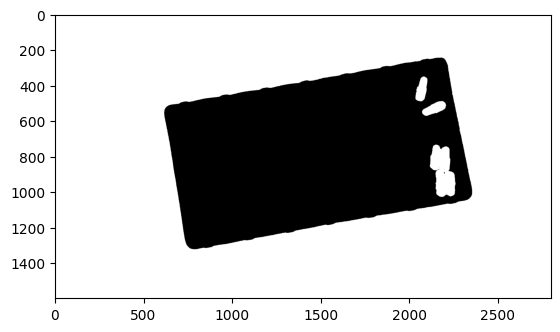

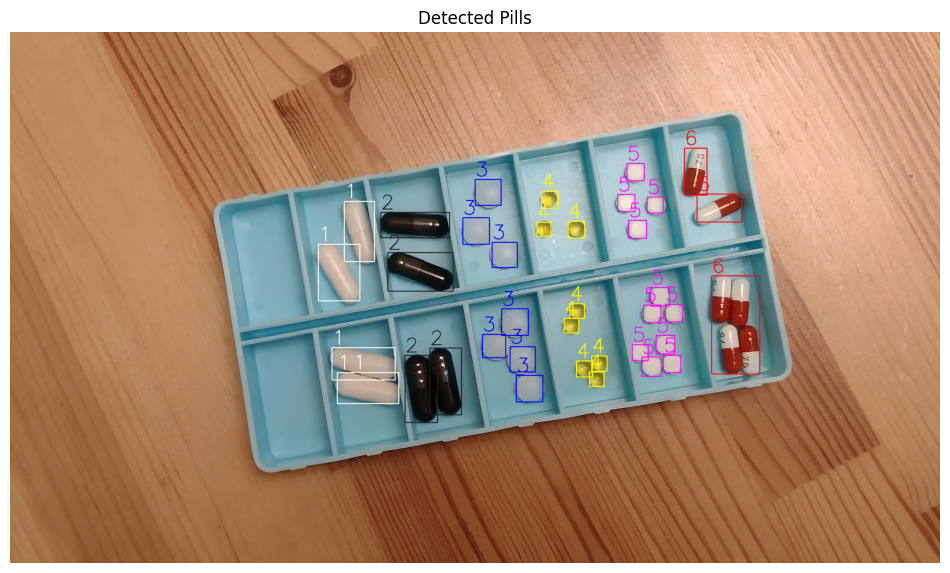

In [224]:
image = calib

objects = detect_objects(image, pilltype = [PillType.ESPU, PillType.PROBIO, PillType.CARBON, PillType.BIOX, PillType.KETO, PillType.LINE])

display_objects(image, objects)

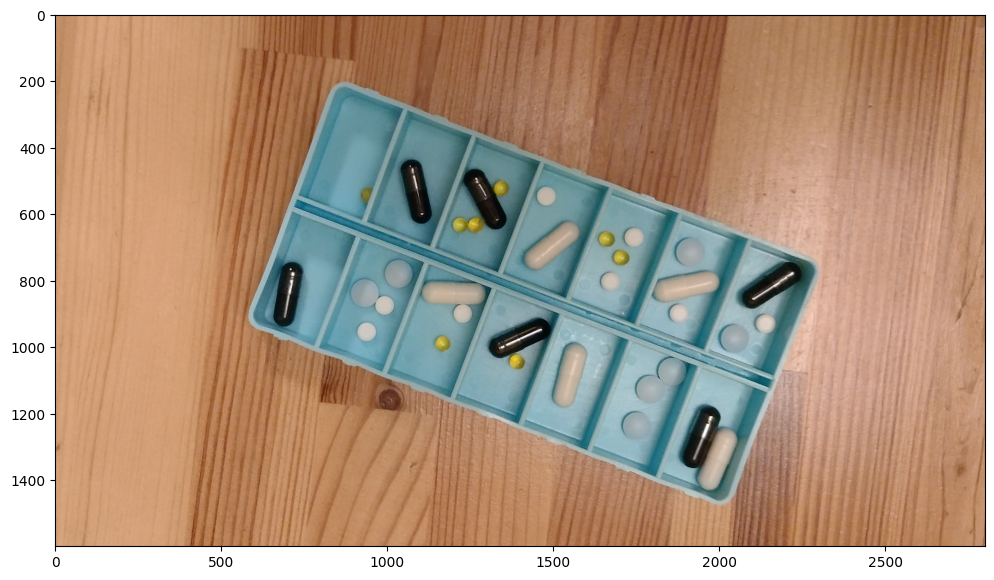

In [191]:
calib2 = cv2.imread('test.png')[..., ::-1]
plt.subplots(1, 1, figsize=(12,8))[1].imshow(calib2);

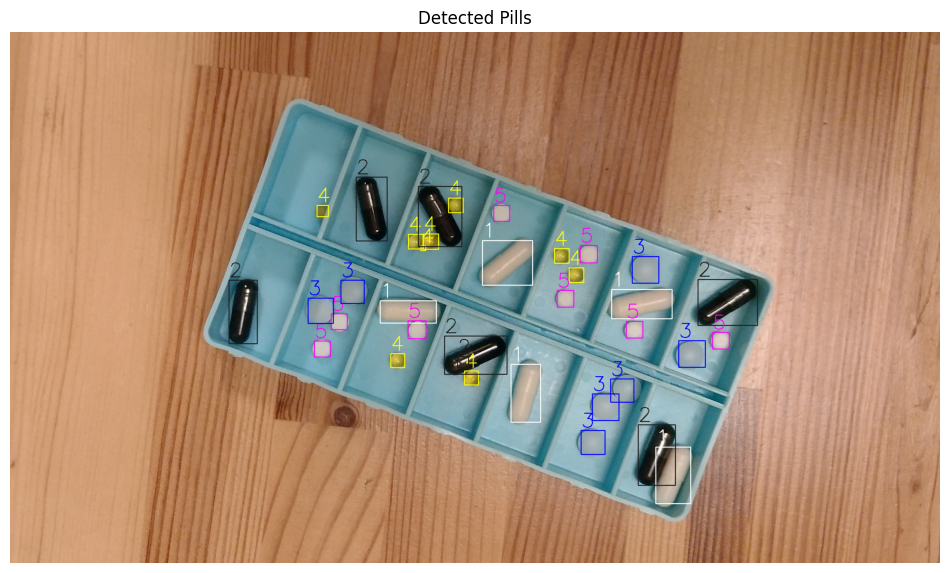

In [ ]:
image = calib2

objects = detect_objects(image, pilltype = [PillType.CARBON, PillType.PROBIO, PillType.ESPU, PillType.BIOX, PillType.KETO])

display_objects(image, objects)

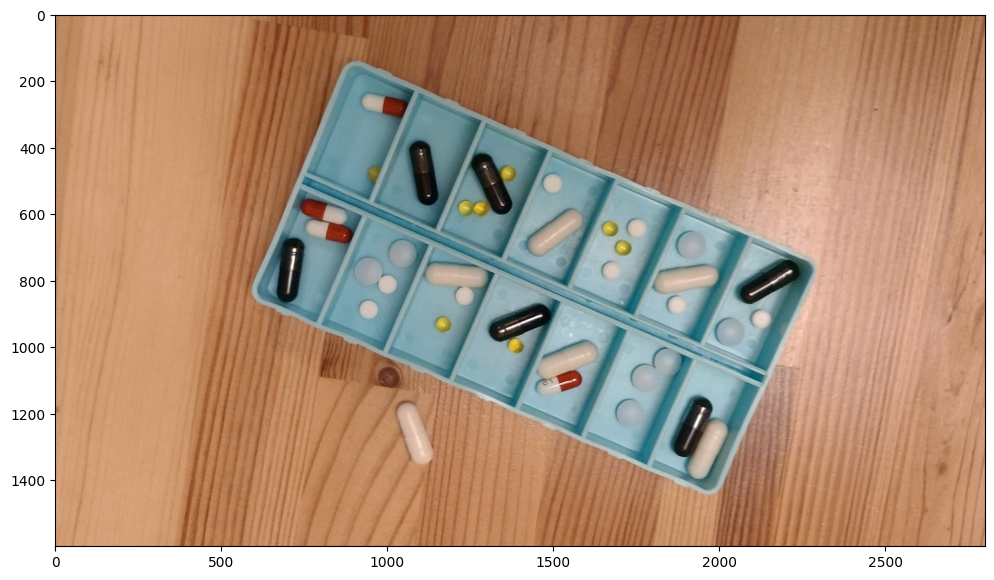

In [226]:
calib3 = cv2.imread('test_line.png')[..., ::-1]
plt.figure(figsize=(12, 10))
plt.imshow(calib3)

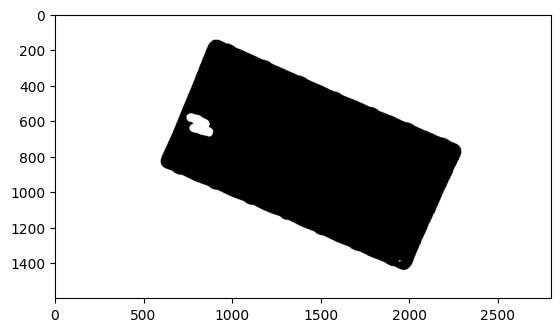

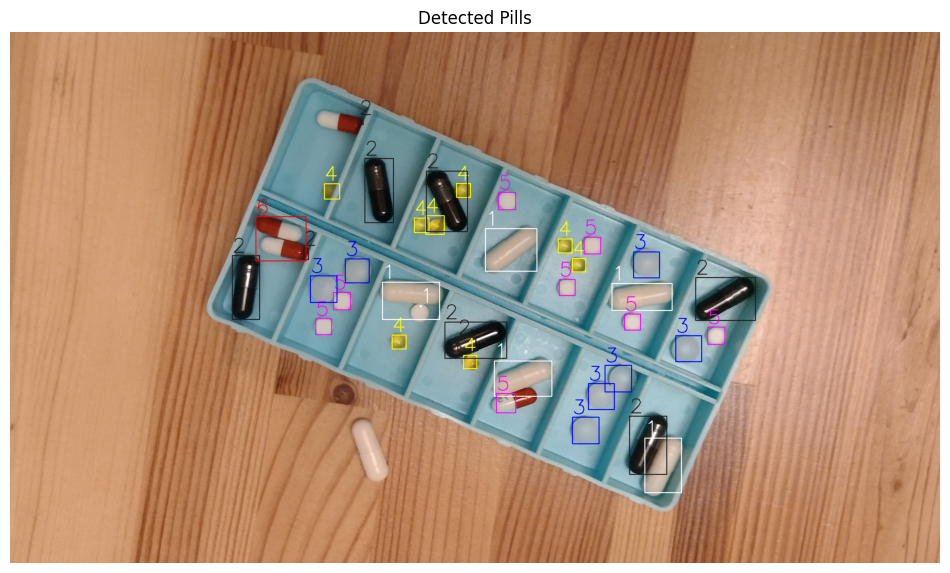

In [227]:
image = calib3

objects = detect_objects(image, pilltype = [PillType.CARBON, PillType.PROBIO, PillType.ESPU, PillType.BIOX, PillType.KETO, PillType.LINE])

display_objects(image, objects)